In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Import the required libraries
from plotly.offline import init_notebook_mode, iplot
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import plotly.graph_objs as go
from wordcloud import WordCloud
from textblob import TextBlob
from plotly import tools
import seaborn as sns
import pandas as pd
import string, os, random
import calendar
from PIL import Image
import numpy as np

import folium
from folium import plugins


init_notebook_mode(connected=True)
punc = string.punctuation
from datetime import datetime


In [ ]:
import pandas as pd

# Load the Excel file
file_path = '/content/drive/My Drive/2018-2024.csv'  # Update the path if needed
gun_violence_data = pd.read_csv(file_path)

# Display the first few rows of the DataFrame
print(gun_violence_data.head())

   Incident ID     Incident Date           State City Or County  \
0      3058359  October 28, 2024       Tennessee        Memphis   
1      3057339  October 27, 2024      California        Redding   
2      3057385  October 27, 2024        Michigan      Kalamazoo   
3      3057141  October 26, 2024  North Carolina         Durham   
4      3056901  October 26, 2024    Pennsylvania  Mc Kees Rocks   

                       Address  Victims Killed  Victims Injured  \
0          3717 Robin Park Cir               0                5   
1        21000 block of CA-299               1                5   
2  1100 block of W Paterson St               0                5   
3          231 Eagle Campus Dr               0                4   
4      Meyers St and Ridge Way               1                3   

   Suspects Killed  Suspects Injured  Suspects Arrested  
0                0                 0                  0  
1                0                 0                  1  
2                0  

#Preprocess

Converting 'Incident Date' into date column.

In [ ]:
# Convert 'Incident Date' to datetime
gun_violence_data['Incident Date'] = pd.to_datetime(gun_violence_data['Incident Date'])

# Check the result
print(gun_violence_data)

      Incident ID Incident Date           State City Or County  \
0         3058359    2024-10-28       Tennessee        Memphis   
1         3057339    2024-10-27      California        Redding   
2         3057385    2024-10-27        Michigan      Kalamazoo   
3         3057141    2024-10-26  North Carolina         Durham   
4         3056901    2024-10-26    Pennsylvania  Mc Kees Rocks   
...           ...           ...             ...            ...   
3782      1022067    2018-01-07         Alabama  Union Springs   
3783      1022055    2018-01-07         Florida     Plantation   
3784      1021788    2018-01-05     Mississippi    Hattiesburg   
3785      1020574    2018-01-04        Arkansas       Brinkley   
3786      1018295    2018-01-01         Alabama     Huntsville   

                          Address  Victims Killed  Victims Injured  \
0             3717 Robin Park Cir               0                5   
1           21000 block of CA-299               1                5 

Checking missing values and removing duplicates

In [ ]:
print(gun_violence_data.isnull().sum())
gun_violence_data.drop_duplicates(inplace=True)

Incident ID           0
Incident Date         0
State                 0
City Or County        0
Address              15
Victims Killed        0
Victims Injured       0
Suspects Killed       0
Suspects Injured      0
Suspects Arrested     0
dtype: int64


Standardize columns

In [ ]:
gun_violence_data.columns = gun_violence_data.columns.str.lower().str.replace(' ', '_')
print(gun_violence_data.sample(10))

      incident_id incident_date         state  city_or_county  \
1175      2448015    2022-10-29       Florida         Orlando   
1843      2154085    2021-10-24    California        Gonzales   
2403      1905423    2021-01-18  Pennsylvania       Tobyhanna   
2448      1870827    2020-12-06         Texas           Venus   
3277      1428595    2019-06-22      Maryland       Baltimore   
1692      2232476    2022-02-12      Arkansas     Little Rock   
1666      2246387    2022-03-03        Nevada       Las Vegas   
23        3041259    2024-10-05      Oklahoma   Oklahoma City   
2858      1703044    2020-06-11     Louisiana          Monroe   
1032      2518860    2023-02-06         Texas  Corpus Christi   

                          address  victims_killed  victims_injured  \
1175        8204 Crystal Clear Ln               0                6   
1843                   Foletta Rd               2                2   
2403                   960 PA-196               0                4   
2448

Creating new features (Month and Year columns)

In [ ]:
gun_violence_data['year'] = gun_violence_data['incident_date'].dt.year
gun_violence_data['month'] = gun_violence_data['incident_date'].dt.month
gun_violence_data['total_victims'] = gun_violence_data['victims_killed'] + gun_violence_data['victims_injured']
gun_violence_data['total_suspects'] = gun_violence_data['suspects_arrested'] + gun_violence_data['suspects_injured'] + gun_violence_data['suspects_killed']
gun_violence_data['monthday'] = gun_violence_data['incident_date'].dt.day
gun_violence_data['weekday'] = gun_violence_data['incident_date'].dt.weekday +1
print(gun_violence_data.sample(10))

      incident_id incident_date           state city_or_county  \
1560      2296808    2022-05-07           Texas        Garland   
1044      2513512    2023-01-29            Ohio       Columbus   
3144      1511999    2019-09-24        Illinois        Chicago   
1009      2531925    2023-02-22         Alabama         Daphne   
56        3020008    2024-09-02      New Jersey         Newark   
58        3012204    2024-09-01            Ohio         Dayton   
2210      2011610    2021-05-22         Indiana     Fort Wayne   
487       2758871    2023-11-18       Tennessee        Memphis   
3030      1594173    2020-01-11        Colorado         Aurora   
3148      1508804    2019-09-21  South Carolina      Lancaster   

                            address  victims_killed  victims_injured  \
1560       800 block of Magnolia Dr               2                2   
1044                   1680 Karl Ct               1                3   
3144  2000 block of South Hoyne Ave               1      

Summary of all columns

In [ ]:
gun_violence_data.describe()

,incident_id,incident_date,victims_killed,victims_injured,suspects_killed,suspects_injured,suspects_arrested,year,month,total_victims,total_suspects,monthday,weekday
count,3.787000e+03,3787,3787.000000,3787.000000,3787.000000,3787.000000,3787.000000,3787.000000,3787.000000,3787.000000,3787.000000,3787.000000,3787.000000
mean,2.112700e+06,2021-09-21 17:30:14.734618112,0.984949,4.115131,0.060206,0.047003,0.602324,2021.217322,6.610774,5.100079,0.709533,15.766834,4.886454
min,1.018295e+06,2018-01-01 00:00:00,0.000000,0.000000,0.000000,0.000000,0.000000,2018.000000,1.000000,0.000000,0.000000,1.000000,1.000000
25%,1.707713e+06,2020-06-15 12:00:00,0.000000,3.000000,0.000000,0.000000,0.000000,2020.000000,5.000000,4.000000,0.000000,8.000000,3.000000
50%,2.133137e+06,2021-10-03 00:00:00,1.000000,4.000000,0.000000,0.000000,0.000000,2021.000000,7.000000,4.000000,0.000000,16.000000,6.000000
75%,2.568809e+06,2023-04-07 00:00:00,1.000000,5.000000,0.000000,0.000000,1.000000,2023.000000,9.000000,5.000000,1.000000,24.000000,7.000000
max,3.058359e+06,2024-10-28 00:00:00,23.000000,32.000000,3.000000,5.000000,14.000000,2024.000000,12.000000,46.000000,16.000000,31.000000,7.000000
std,5.410069e+05,NaN,1.433335,2.354246,0.250869,0.259848,1.106469,1.802310,2.990489,2.490928,1.198529,9.049245,2.041253


Categorize based on COVID.

In [ ]:
# Define the date ranges
before_start = pd.Timestamp('2018-01-01')
before_end = pd.Timestamp('2020-01-01')

during_start = pd.Timestamp('2020-03-01')
during_end = pd.Timestamp('2023-05-01')

after_start = pd.Timestamp('2023-05-01')
after_end = pd.Timestamp('2024-10-28'

# Create the new column 'period'
gun_violence_data['period'] = pd.cut(gun_violence_data['incident_date'],
                                     bins=[pd.Timestamp.min, before_end, during_end, after_end],
                                     labels=['Before', 'During', 'After'],
                                     right=True)

# Display the updated DataFrame
print(gun_violence_data[['incident_id', 'incident_date', 'period']])
# Step 3: Count incidents in each period
incident_counts = gun_violence_data['period'].value_counts()

# Step 4: Calculate the number of days in each period
days_before = (before_end - before_start).days
days_during = (during_end - during_start).days
days_after = (after_end - after_start).days

# Create a dictionary for days in each period
days_in_periods = {
    'Before': days_before,
    'During': days_during,
    'After': days_after
}

# Step 5: Calculate the average number of incidents per day for each period
average_incidents = incident_counts / [days_in_periods['Before'], days_in_periods['During'], days_in_periods['After']]

# Display results
result = pd.DataFrame({
    'Incident Count': incident_counts,
    'Days in Period': [days_during, days_after, days_before],
    'Average Incidents per Day': average_incidents
})

print(result)

      incident_id incident_date  period
0         3058359    2024-10-28   After
1         3057339    2024-10-27   After
2         3057385    2024-10-27   After
3         3057141    2024-10-26   After
4         3056901    2024-10-26   After
...           ...           ...     ...
3782      1022067    2018-01-07  Before
3783      1022055    2018-01-07  Before
3784      1021788    2018-01-05  Before
3785      1020574    2018-01-04  Before
3786      1018295    2018-01-01  Before

[3787 rows x 3 columns]
        Incident Count  Days in Period  Average Incidents per Day
period                                                           
During            2132            1156                   2.920548
After              903             546                   0.781142
Before             752             730                   1.377289


Split into similar incidents (Intensity)

In [ ]:
# Calculate quantiles for 'total_victims'
total_victims_low_quantile = gun_violence_data['total_victims'].quantile(0.33)
total_victims_high_quantile = gun_violence_data['total_victims'].quantile(0.67)

# Print the quantile values
print("Total Victims Low Quantile (33rd Percentile):", total_victims_low_quantile)
print("Total Victims High Quantile (67th Percentile):", total_victims_high_quantile)

# Create a new 'intensity' column based on quantiles
gun_violence_data['intensity'] = pd.cut(gun_violence_data['total_victims'],
                                        bins=[-float('inf'), total_victims_low_quantile, total_victims_high_quantile, float('inf')],
                                        labels=['low', 'medium', 'high'])

# Display the updated DataFrame with the 'intensity' column
print(gun_violence_data[['incident_id', 'total_victims', 'intensity']].sample(5))
intensity_counts = gun_violence_data['intensity'].value_counts()
print("Count of Intensity Levels:")
print(intensity_counts)

Total Victims Low Quantile (33rd Percentile): 4.0
Total Victims High Quantile (67th Percentile): 5.0
      incident_id  total_victims intensity
3635      1151527              4       low
1932      2114626              4       low
2849      1704176              5    medium
1594      2280711             10      high
977       2549324              4       low
Count of Intensity Levels:
intensity
low       2130
high       831
medium     826
Name: count, dtype: int64


In [ ]:
print(gun_violence_data.columns)

Index(['incident_id', 'incident_date', 'state', 'city_or_county', 'address',
       'victims_killed', 'victims_injured', 'suspects_killed',
       'suspects_injured', 'suspects_arrested', 'year', 'month',
       'total_victims', 'total_suspects', 'monthday', 'weekday', 'period',
       'intensity'],
      dtype='object')


Top States and Cities

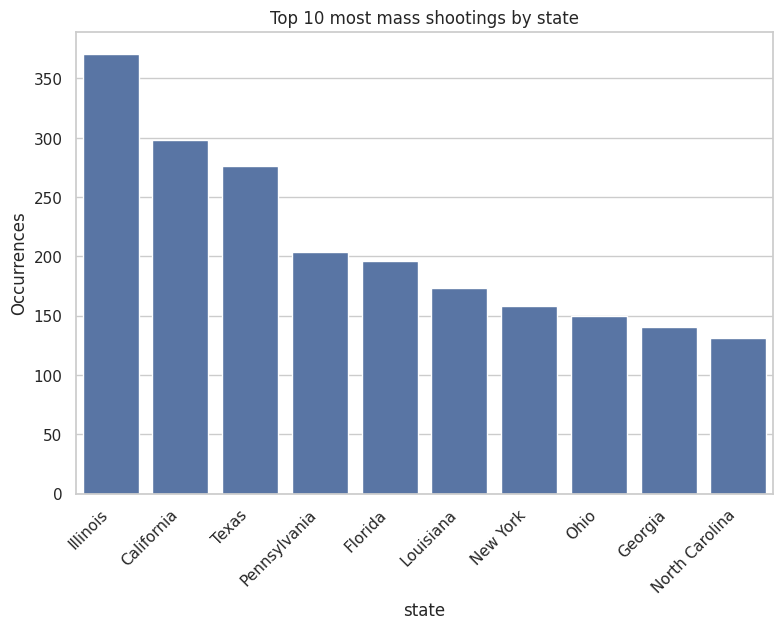

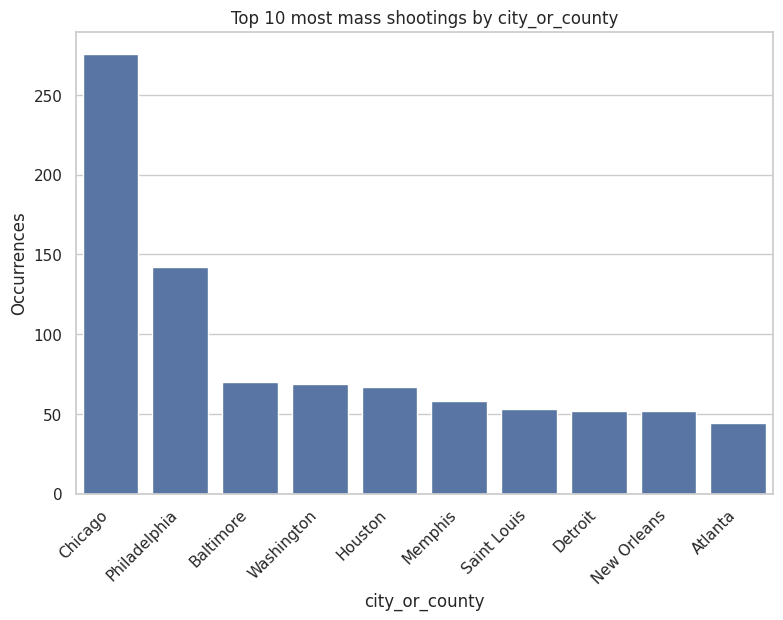

In [ ]:
# Set style for seaborn
sns.set(style="whitegrid")

# List of categorical variables
categorical_vars = ['state', 'city_or_county']

# Function to create a histogram for a categorical variable
def plot_histogram(gun_violence_data, col_name, top_n=10):
    # Count occurrences
    value_counts = gun_violence_data[col_name].value_counts().head(top_n)

    # Plot the histogram
    plt.figure(figsize=(9, 6))
    sns.barplot(x=value_counts.index, y=value_counts.values)
    plt.title(f"Top {top_n} most mass shootings by {col_name}")
    plt.xlabel(col_name)
    plt.ylabel('Occurrences')
    plt.xticks(rotation=45, ha='right')
    plt.show()

# Plot histograms for each categorical variable
for col in categorical_vars:
    plot_histogram(gun_violence_data, col)

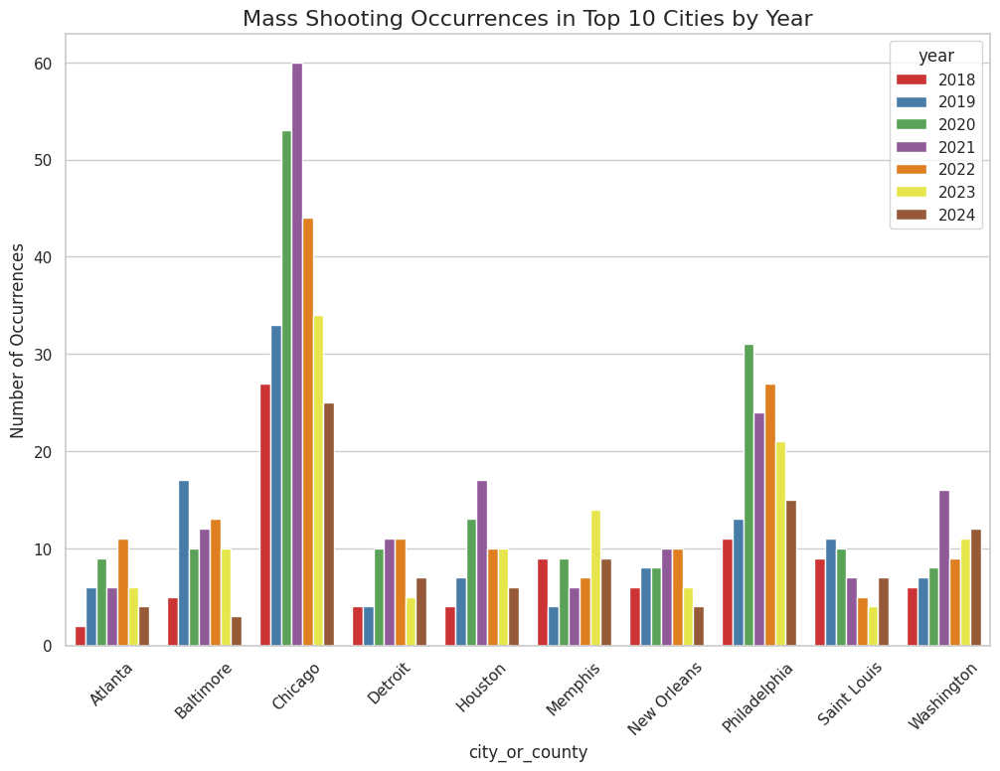

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Find the top 10 cities with the most gun violence occurrences
top_10_cities = gun_violence_data['city_or_county'].value_counts().nlargest(10).index

# Step 2: Filter the data for these top 10 cities
top_cities_data = gun_violence_data[gun_violence_data['city_or_county'].isin(top_10_cities)]

# Step 3: Group the data by city and year to get the count of occurrences
city_year_counts = top_cities_data.groupby(['city_or_county', 'year']).size().reset_index(name='occurrences')

# Step 4: Create a multiple bar plot
plt.figure(figsize=(12, 8))
sns.barplot(x='city_or_county', y='occurrences', hue='year', data=city_year_counts, palette='Set1')

# Step 5: Set plot labels and title
plt.title('Mass Shooting Occurrences in Top 10 Cities by Year', fontsize=16)
plt.xlabel('city_or_county', fontsize=12)
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xticks(rotation=45)

# Step 6: Display the plot
plt.show()


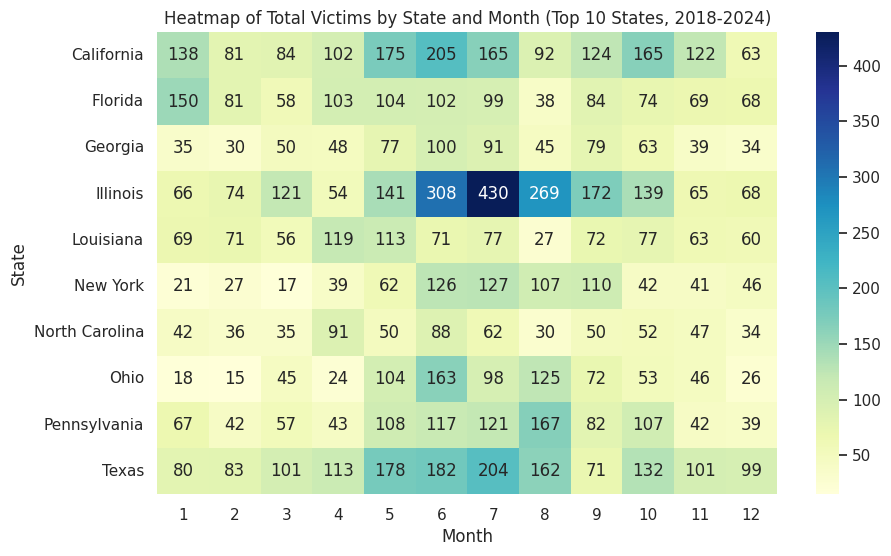

In [ ]:
# Get top 10 states by the total number of incidents
top_10_states = gun_violence_data['state'].value_counts().nlargest(10).index

# Filter gun_violence_data for the top 10 states
top_10_data = gun_violence_data[gun_violence_data['state'].isin(top_10_states)]

# Cross-tab for state and month showing total victims for the top 10 states
crosstab = pd.crosstab(top_10_data['state'], top_10_data['month'], values=top_10_data['total_victims'], aggfunc='sum').fillna(0)

# Plot heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(crosstab, cmap="YlGnBu", annot=True, fmt=".0f")  # fmt=".0f" to remove decimal points
plt.title('Heatmap of Total Victims by State and Month (Top 10 States, 2018-2024)')
plt.xlabel('Month')
plt.ylabel('State')
plt.show()

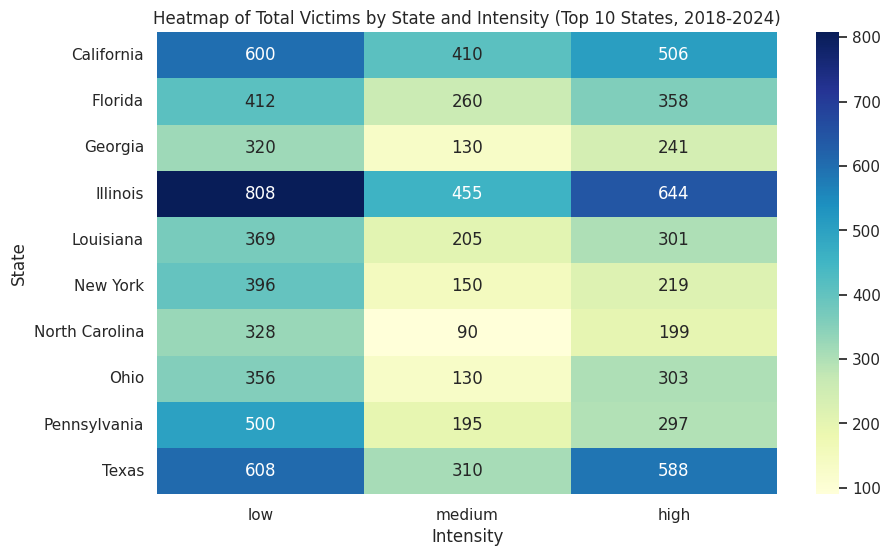

In [ ]:
# Get top 10 states by the total number of incidents
top_10_states = gun_violence_data['state'].value_counts().nlargest(10).index

# Filter gun_violence_data for the top 10 states
top_10_data = gun_violence_data[gun_violence_data['state'].isin(top_10_states)]

# Cross-tab for state and month showing total victims for the top 10 states
crosstab = pd.crosstab(top_10_data['state'], top_10_data['intensity'], values=top_10_data['total_victims'], aggfunc='sum').fillna(0)

# Plot heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(crosstab, cmap="YlGnBu", annot=True, fmt=".0f")  # fmt=".0f" to remove decimal points
plt.title('Heatmap of Total Victims by State and Intensity (Top 10 States, 2018-2024)')
plt.xlabel('Intensity')
plt.ylabel('State')
plt.show()

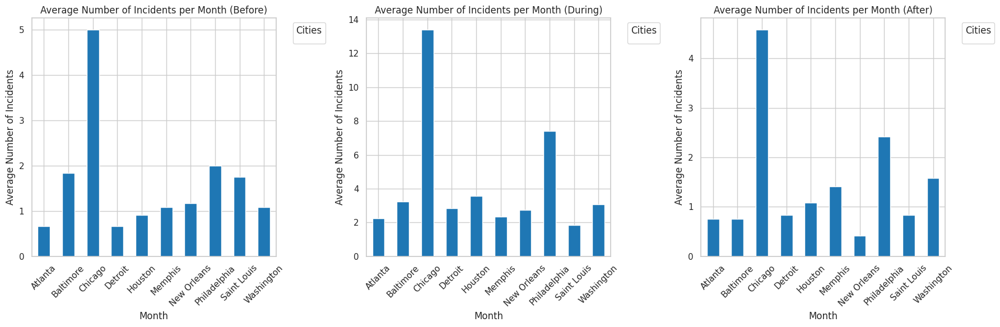

In [ ]:
# Define the periods
periods = ['Before', 'During', 'After']

# Create a figure for the subplots
plt.figure(figsize=(18, 6))

# Get top 10 states with the most incidents
top_10_states = gun_violence_data['city_or_county'].value_counts().nlargest(10).index

for i, period in enumerate(periods):
    # Filter the dataset for the current period
    period_data = gun_violence_data[(gun_violence_data['period'] == period) & (gun_violence_data['city_or_county'].isin(top_10_states))]

    # Grouping by month and state to calculate the average number of incidents
    monthly_incidents = period_data.groupby(['month', 'city_or_county']).size().unstack(fill_value=0)

    # Calculate the average number of incidents for each month per state
    average_incidents = monthly_incidents.mean()

    # Create a subplot for each period
    plt.subplot(1, 3, i + 1)
    average_incidents.plot(kind='bar', stacked=True, ax=plt.gca(), colormap='tab20')
    plt.title(f'Average Number of Incidents per Month ({period})')
    plt.xlabel('Month')
    plt.ylabel('Average Number of Incidents')
    plt.xticks(rotation=45)
    plt.legend(title='Cities', bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

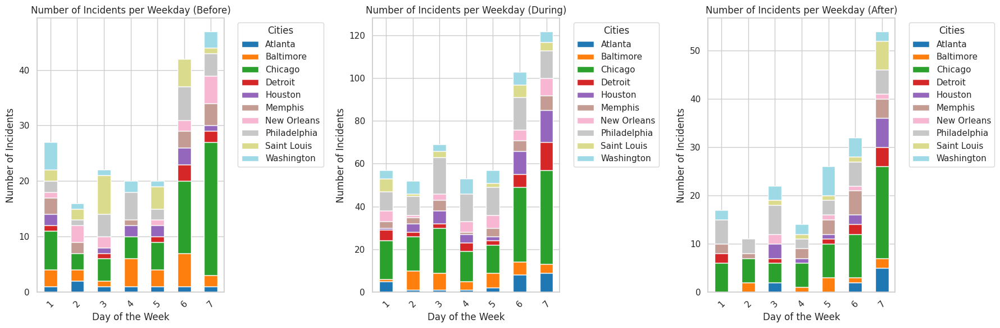

In [ ]:
# Define the periods
periods = ['Before', 'During', 'After']

# Create a figure for the subplots
plt.figure(figsize=(18, 6))

# Get top 10 states with the most incidents
top_10_states = gun_violence_data['city_or_county'].value_counts().nlargest(10).index

for i, period in enumerate(periods):
    # Filter the dataset for the current period
    period_data = gun_violence_data[(gun_violence_data['period'] == period) & (gun_violence_data['city_or_county'].isin(top_10_states))]

    # Grouping by weekday and state to calculate the number of incidents
    weekly_incidents = period_data.groupby(['weekday', 'city_or_county']).size().unstack(fill_value=0)

    # Create a subplot for each period
    plt.subplot(1, 3, i + 1)
    weekly_incidents.plot(kind='bar', stacked=True, ax=plt.gca(), colormap='tab20')
    plt.title(f'Number of Incidents per Weekday ({period})')
    plt.xlabel('Day of the Week')
    plt.ylabel('Number of Incidents')
    plt.xticks(rotation=45)
    plt.legend(title='Cities', bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

- Illinois see a huge number of victims in from June to October.
- Texas also sees a huge number of victims but in May and July.
- California sees a huge number of victims in January.

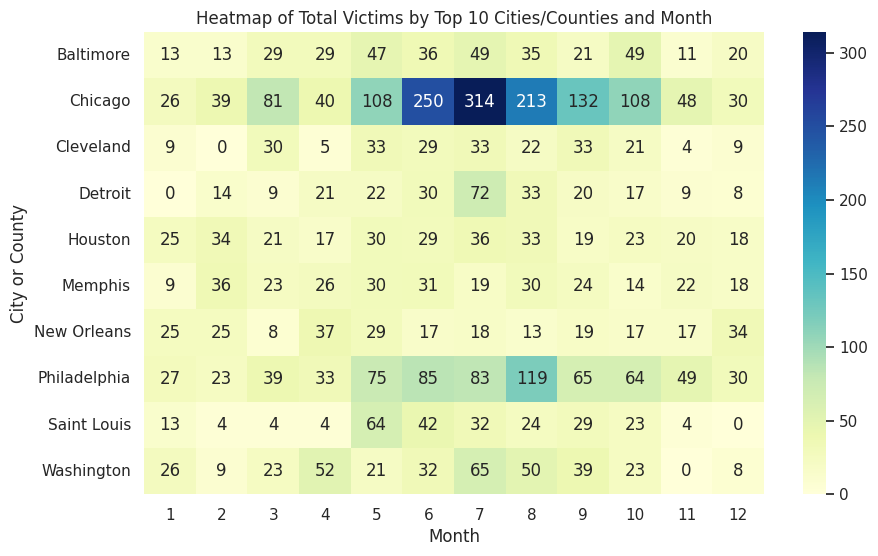

In [ ]:
# Calculate the total number of victims per city_or_county
city_totals = gun_violence_data.groupby('city_or_county')['total_victims'].sum()

# Get the top 10 cities or counties with the most total victims
top_10_cities = city_totals.nlargest(10).index

# Filter the data to include only the top 10 cities or counties
top_10_data = gun_violence_data[gun_violence_data['city_or_county'].isin(top_10_cities)]

# Create the crosstab for the top 10 cities or counties
crosstab_top_10 = pd.crosstab(top_10_data['city_or_county'], top_10_data['month'],
                              values=top_10_data['total_victims'], aggfunc='sum').fillna(0)

# Plot the heatmap
plt.figure(figsize=(10,6))
sns.heatmap(crosstab_top_10, cmap="YlGnBu", annot=True, fmt=".0f")  # fmt=".0f" to avoid decimals
plt.title('Heatmap of Total Victims by Top 10 Cities/Counties and Month')
plt.xlabel('Month')
plt.ylabel('City or County')
plt.show()

#Filtering into Illinois

In [ ]:
import pandas as pd

# Load the Excel file
file_path = '/content/drive/My Drive/sub_dataset.xlsx'  # Update the path if needed
sub_dataset = pd.read_excel(file_path)

# Display the first few rows of the DataFrame
print(sub_dataset.head())
print(sub_dataset.shape)

   incident_id incident_date     state city_or_county  \
0      3034398    2024-09-26  Illinois        Chicago   
1      3030761    2024-09-21  Illinois        Chicago   
2      3026197    2024-09-16  Illinois        Chicago   
3      3012631    2024-09-02  Illinois    Forest Park   
4      3000990    2024-08-20  Illinois        Chicago   

                         address  victims_killed  victims_injured  \
0                4255 N Knox Ave               0                4   
1  2500 block of S Spaulding Ave               1                6   
2                 1500 W 51st St               0                4   
3             711 Desplaines Ave               4                0   
4        51st St and Ashland Ave               1                5   

   suspects_killed  suspects_injured  suspects_arrested  year  month  \
0                0                 0                  0  2024      9   
1                0                 0                  0  2024      9   
2                0        

In [ ]:
sub_dataset = sub_dataset[sub_dataset['city_or_county'] == 'Chicago']
print(sub_dataset.shape)

(276, 19)


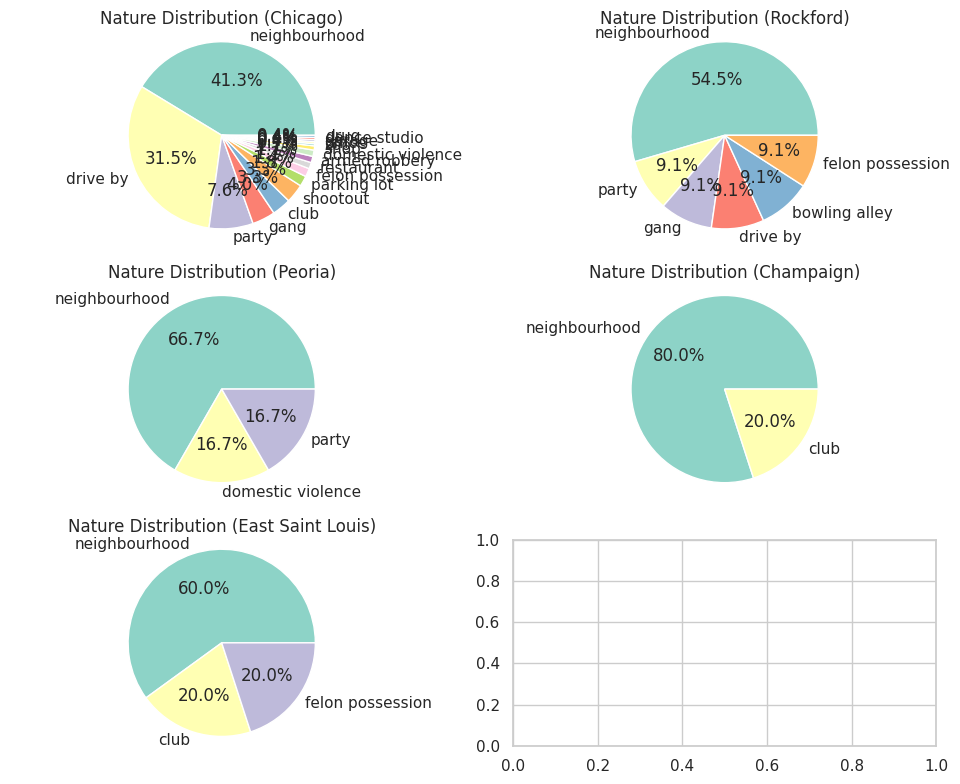

In [ ]:
# Get the top 5 cities/counties based on incident count
top_cities = sub_dataset['city_or_county'].value_counts().head(5).index

# Set up the figure for subplots (3 rows, 2 columns) to accommodate 5 pie charts
fig, axes = plt.subplots(3, 2, figsize=(10, 8))  # 3 rows, 2 columns

# Flatten the axes to make it easier to index
axes = axes.flatten()

# Loop through each top city/county and create a pie chart
for i, city in enumerate(top_cities):
    city_data = sub_dataset[sub_dataset['city_or_county'] == city]['nature'].value_counts()

    # Create pie chart for the current city/county
    axes[i].pie(city_data, labels=city_data.index, autopct='%1.1f%%', colors=plt.cm.Set3.colors)
    axes[i].set_title(f'Nature Distribution ({city})')
    axes[i].axis('equal')  # Equal aspect ratio ensures the pie chart is circular

# Display the pie charts
plt.tight_layout()
plt.show()

In [ ]:
print(sub_dataset.columns)

Index(['incident_id', 'incident_date', 'state', 'city_or_county', 'address',
       'victims_killed', 'victims_injured', 'suspects_killed',
       'suspects_injured', 'suspects_arrested', 'year', 'month',
       'total_victims', 'total_suspects', 'monthday', 'weekday', 'period',
       'intensity', 'nature'],
      dtype='object')


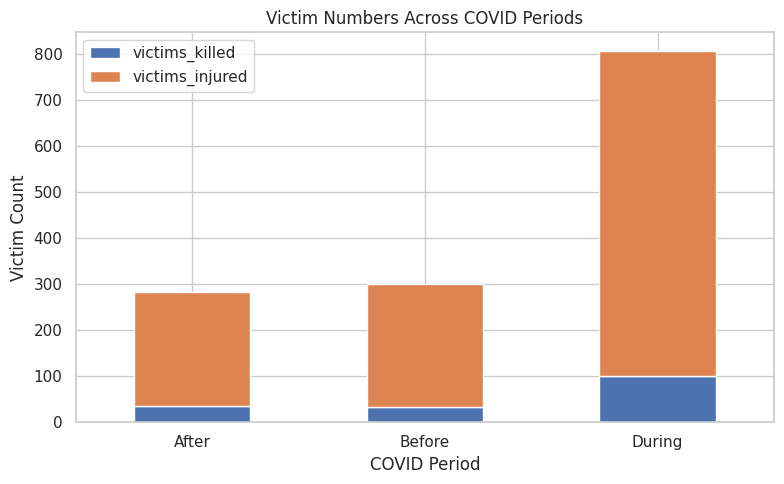

In [ ]:
covid_victims = sub_dataset.groupby('period')[['victims_killed', 'victims_injured']].sum()
covid_victims.plot(kind='bar', stacked=True, figsize=(8, 5))
plt.title('Victim Numbers Across COVID Periods')
plt.xlabel('COVID Period')
plt.ylabel('Victim Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


We can see that most victims come during COVID, regardless of victims killed or victims injured. This aligns with the % of incidents during COVID. This would be a good platform to investigate any legislation changes that led to reduction of incidents after COVID or before COVID.

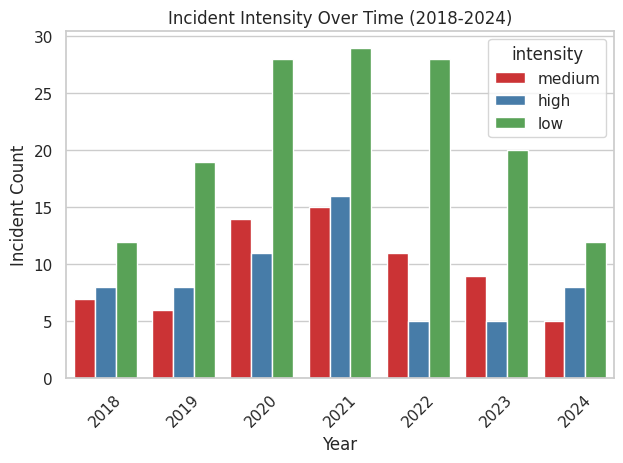

In [ ]:
sns.countplot(data=sub_dataset, x='year', hue='intensity', palette='Set1')
plt.title('Incident Intensity Over Time (2018-2024)')
plt.xlabel('Year')
plt.ylabel('Incident Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

We see that all intensity incidents rise during COVID which aligns with our previous graph, and eventually reduces. However, we do see sometimes number of medium incidents are greater than high, or vice-versa. This can be investigated with any law changes that might have affected this.

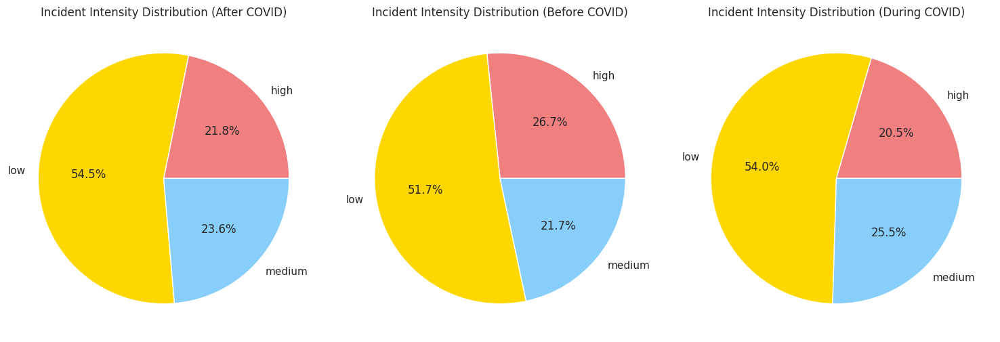

In [ ]:
import matplotlib.pyplot as plt

# Group the data by 'period' and 'intensity' to get counts
period_intensity_counts = sub_dataset.groupby(['period', 'intensity']).size().unstack(fill_value=0)

# Plot pie charts for each period
periods = period_intensity_counts.index
intensities = period_intensity_counts.columns

plt.figure(figsize=(15, 5))

for i, period in enumerate(periods):
    plt.subplot(1, 3, i + 1)
    plt.pie(period_intensity_counts.loc[period], labels=intensities, autopct='%1.1f%%', colors=['lightcoral', 'gold', 'lightskyblue'])
    plt.title(f'Incident Intensity Distribution ({period} COVID)')

plt.tight_layout()
plt.show()


This pie chart representation aligns with our bar chart showcasing the % of incidents showing there has been no change in the consistency of incident intensity distribution over periods of time.

In [ ]:
# Ensure 'incident_date' is in datetime format
sub_dataset['incident_date'] = pd.to_datetime(sub_dataset['incident_date'])

# Create new columns for day of the month and year
sub_dataset['monthday'] = sub_dataset['incident_date'].dt.day
sub_dataset['year'] = sub_dataset['incident_date'].dt.year

# Define the years you want to analyze
selected_years = sub_dataset['year'].unique()

# Initialize a dictionary to store top 3 monthdays for each year
top_monthdays = {}

# Loop through each year to calculate top monthdays
for year in selected_years:
    # Filter the dataset for the current year
    year_data = sub_dataset[sub_dataset['year'] == year]

    # Grouping by monthday to calculate the number of incidents
    monthly_incidents = year_data.groupby('monthday').size()

    # Get the top 3 monthdays
    top_days = monthly_incidents.nlargest(3)

    # Store the results in the dictionary
    top_monthdays[year] = top_days

# Print the top 3 monthdays for all years
for year, days in top_monthdays.items():
    print(f"Top 3 monthdays for {year}:")
    for day, count in days.items():
        print(f"Day: {day}, Incidents: {count}")
    print()  # Blank line for better readability

Top 3 monthdays for 2024:
Day: 4, Incidents: 3
Day: 5, Incidents: 2
Day: 12, Incidents: 2

Top 3 monthdays for 2023:
Day: 18, Incidents: 4
Day: 23, Incidents: 3
Day: 30, Incidents: 3

Top 3 monthdays for 2022:
Day: 23, Incidents: 5
Day: 6, Incidents: 3
Day: 7, Incidents: 3

Top 3 monthdays for 2021:
Day: 15, Incidents: 5
Day: 21, Incidents: 5
Day: 14, Incidents: 4

Top 3 monthdays for 2020:
Day: 19, Incidents: 5
Day: 7, Incidents: 4
Day: 23, Incidents: 4

Top 3 monthdays for 2019:
Day: 4, Incidents: 3
Day: 1, Incidents: 2
Day: 3, Incidents: 2

Top 3 monthdays for 2018:
Day: 5, Incidents: 5
Day: 21, Incidents: 3
Day: 1, Incidents: 2



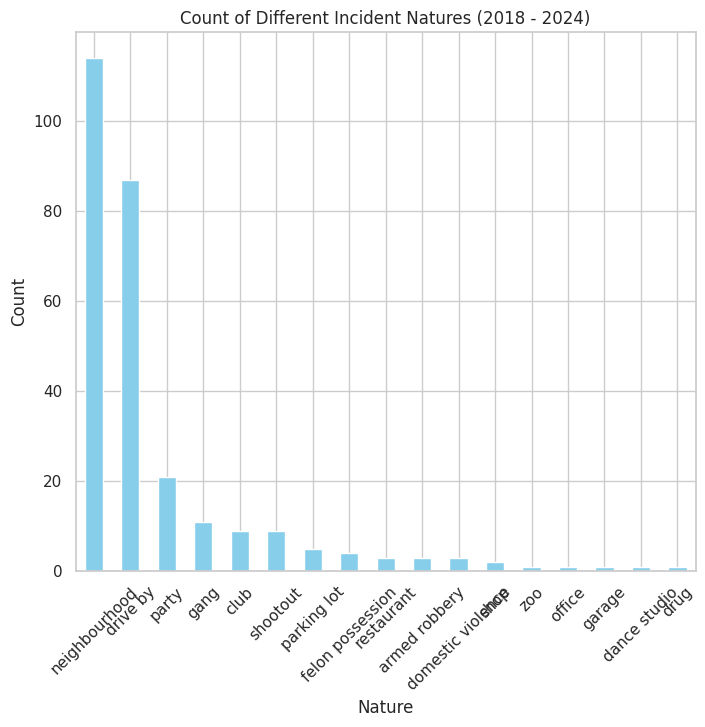

In [ ]:
plt.figure(figsize=(8,7))
sub_dataset['nature'].value_counts().plot(kind='bar', color='skyblue')
plt.title('Count of Different Incident Natures (2018 - 2024)')
plt.xlabel('Nature')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


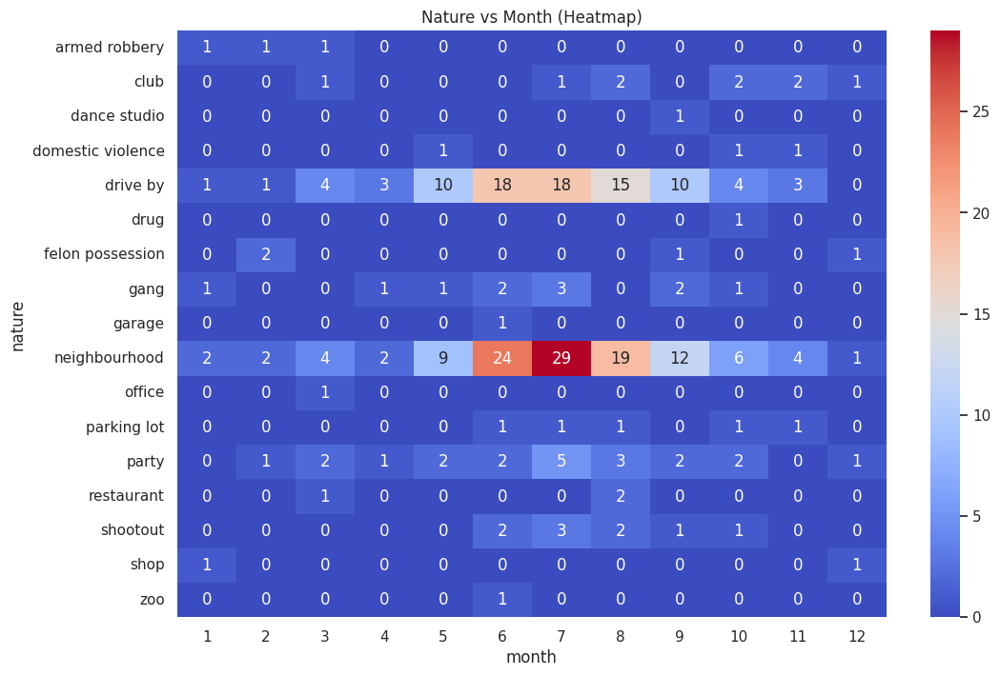

In [ ]:
# Crosstab for nature vs city_or_county and year
nature_city_year_crosstab = pd.crosstab(sub_dataset['nature'], [sub_dataset['month']])

# Plot heatmap
plt.figure(figsize=(12,8))
sns.heatmap(nature_city_year_crosstab, annot=True, fmt=".0f", cmap='coolwarm')
plt.title('Nature vs Month (Heatmap)')
plt.show()


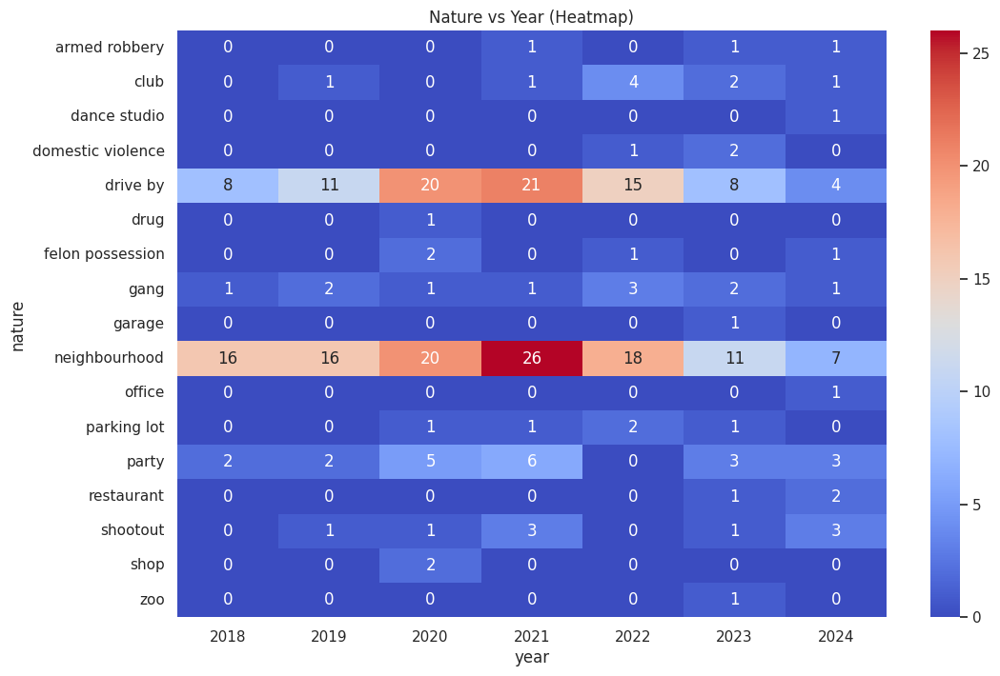

In [ ]:
# Crosstab for nature vs city_or_county and year
nature_city_year_crosstab = pd.crosstab(sub_dataset['nature'], [sub_dataset['year']])

# Plot heatmap
plt.figure(figsize=(12,8))
sns.heatmap(nature_city_year_crosstab, annot=True, fmt=".0f", cmap='coolwarm')
plt.title('Nature vs Year (Heatmap)')
plt.show()


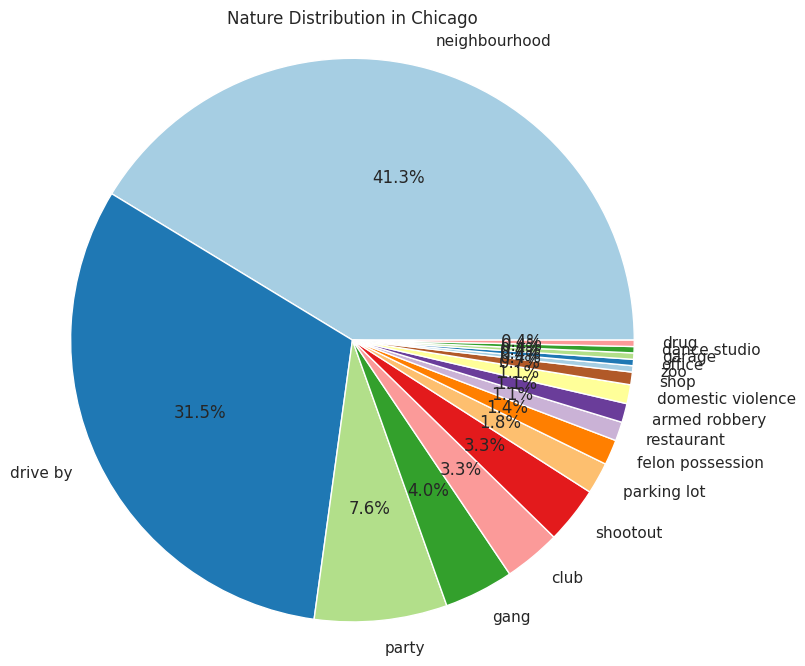

In [ ]:
# Filter the dataset for incidents in Chicago
chicago_data = sub_dataset[sub_dataset['city_or_county'] == 'Chicago']['nature'].value_counts()

# Create a pie chart for Chicago
plt.figure(figsize=(8, 8))
plt.pie(chicago_data, labels=chicago_data.index, autopct='%1.1f%%', colors=plt.cm.Paired.colors)
plt.title('Nature Distribution in Chicago')
plt.axis('equal')  # Equal aspect ratio ensures the pie chart is circular
plt.show()

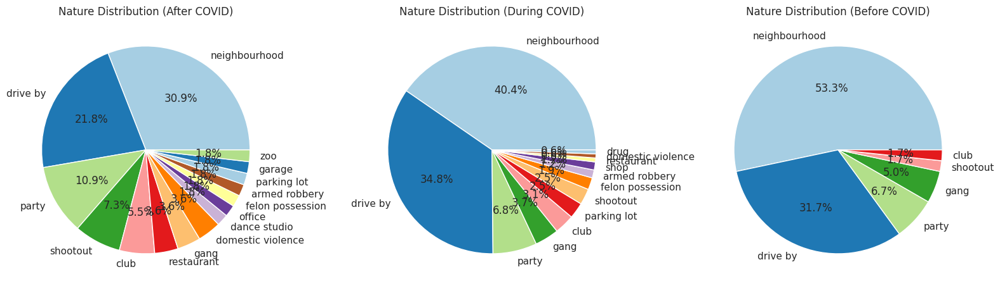

In [ ]:
# Define periods to create a separate pie chart for each period
periods = sub_dataset['period'].unique()

# Set up the figure for subplots (1 row, number of periods columns)
fig, axes = plt.subplots(1, len(periods), figsize=(16, 8))

# Loop through each period and create a pie chart
for i, period in enumerate(periods):
    period_data = sub_dataset[sub_dataset['period'] == period]['nature'].value_counts()

    # Create pie chart for the current period
    axes[i].pie(period_data, labels=period_data.index, autopct='%1.1f%%', colors=plt.cm.Paired.colors)
    axes[i].set_title(f'Nature Distribution ({period} COVID)')
      # Equal aspect ratio ensures the pie chart is circular

# Display the pie charts
plt.tight_layout()
plt.show()

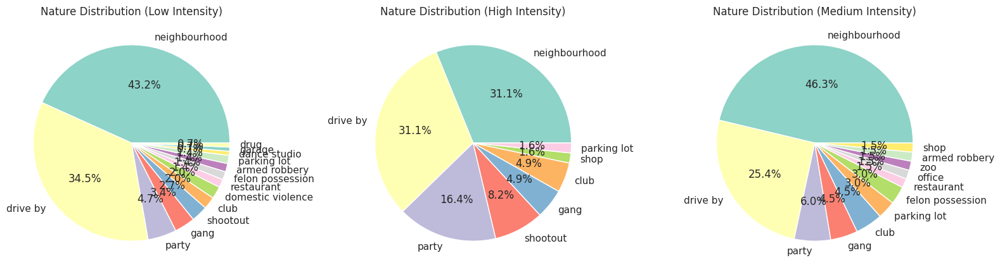

In [ ]:
# Define intensity levels to create a separate pie chart for each intensity
intensities = sub_dataset['intensity'].unique()

# Set up the figure for subplots (1 row, number of intensity levels columns)
fig, axes = plt.subplots(1, len(intensities), figsize=(16, 8))

# Loop through each intensity and create a pie chart
for i, intensity in enumerate(intensities):
    intensity_data = sub_dataset[sub_dataset['intensity'] == intensity]['nature'].value_counts()

    # Create pie chart for the current intensity
    axes[i].pie(intensity_data, labels=intensity_data.index, autopct='%1.1f%%', colors=plt.cm.Set3.colors)
    axes[i].set_title(f'Nature Distribution ({intensity.capitalize()} Intensity)')

# Display the pie charts
plt.tight_layout()
plt.show()

In [ ]:
# Print unique values from the 'nature' column
unique_values = sub_dataset['nature'].unique()

# Display the unique values
print(unique_values)

['drive by' 'party' 'dance studio' 'neighbourhood' 'club' 'restaurant'
 'shootout' 'gang' 'office' 'felon possession' 'armed robbery'
 'domestic violence' 'parking lot' 'garage' 'zoo' 'shop' 'drug']


# ITSA

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd

# Load the Excel file
file_path = '/content/drive/My Drive/sub_dataset.xlsx'  # Update the path if needed
sub_dataset = pd.read_excel(file_path)

# Display the first few rows of the DataFrame
print(sub_dataset.head())

   incident_id incident_date     state city_or_county  \
0      3034398    2024-09-26  Illinois        Chicago   
1      3030761    2024-09-21  Illinois        Chicago   
2      3026197    2024-09-16  Illinois        Chicago   
3      3012631    2024-09-02  Illinois    Forest Park   
4      3000990    2024-08-20  Illinois        Chicago   

                         address  victims_killed  victims_injured  \
0                4255 N Knox Ave               0                4   
1  2500 block of S Spaulding Ave               1                6   
2                 1500 W 51st St               0                4   
3             711 Desplaines Ave               4                0   
4        51st St and Ashland Ave               1                5   

   suspects_killed  suspects_injured  suspects_arrested  year  month  \
0                0                 0                  0  2024      9   
1                0                 0                  0  2024      9   
2                0        

In [ ]:
sub_dataset = sub_dataset[sub_dataset['city_or_county'] == 'Chicago']
print(sub_dataset.head)

<bound method NDFrame.head of      incident_id incident_date     state city_or_county  \
0        3034398    2024-09-26  Illinois        Chicago   
1        3030761    2024-09-21  Illinois        Chicago   
2        3026197    2024-09-16  Illinois        Chicago   
4        3000990    2024-08-20  Illinois        Chicago   
5        2992918    2024-08-12  Illinois        Chicago   
..           ...           ...       ...            ...   
360      1143524    2018-06-17  Illinois        Chicago   
362      1137473    2018-06-10  Illinois        Chicago   
364      1131909    2018-06-03  Illinois        Chicago   
366      1106451    2018-05-02  Illinois        Chicago   
370      1031851    2018-01-21  Illinois        Chicago   

                            address  victims_killed  victims_injured  \
0                   4255 N Knox Ave               0                4   
1     2500 block of S Spaulding Ave               1                6   
2                    1500 W 51st St          

In [ ]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from scipy import stats
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.structural import UnobservedComponents

class GunViolenceITSA:
    def __init__(self, data, intervention_date='2019-01-01'):
        self.data = data.copy()
        self.intervention_date = pd.to_datetime(intervention_date)
        self.data['incident_date'] = pd.to_datetime(self.data['incident_date'])

        # Convert intensity to numeric
        intensity_map = {'low': 1, 'medium': 2, 'high': 3}
        self.data['intensity_num'] = self.data['intensity'].map(intensity_map)

    def prepare_monthly_data(self):
        """Prepare monthly aggregated data specific to gun violence metrics"""
        monthly = pd.DataFrame()

        # Group by month
        grouped = self.data.groupby(pd.Grouper(key='incident_date', freq='M'))

        # Core metrics
        monthly['incident_count'] = grouped.size()
        monthly['avg_victims_killed'] = grouped['victims_killed'].mean()
        monthly['avg_victims_injured'] = grouped['victims_injured'].mean()
        monthly['avg_total_victims'] = grouped['total_victims'].mean()
        monthly['avg_intensity'] = grouped['intensity_num'].mean()

        # Additional metrics
        monthly['high_intensity_pct'] = (grouped['intensity'].apply(
            lambda x: (x == 'high').mean() * 100))

        # Nature of incidents
        nature_counts = grouped['nature'].apply(
            lambda x: x.value_counts()).unstack().fillna(0)
        for col in nature_counts.columns:
            monthly[f'nature_{col.replace(" ", "_")}'] = nature_counts[col]

        # Time variables
        monthly['time'] = range(len(monthly))
        monthly['intervention'] = (monthly.index >= self.intervention_date).astype(int)
        monthly['time_since'] = monthly['time'] * monthly['intervention']

        return monthly.fillna(0)

    def segment_analysis(self, outcome_var, data=None):
        """Perform segmented regression with robust standard errors"""
        if data is None:
            data = self.prepare_monthly_data()

        # Prepare model
        X = sm.add_constant(data[['time', 'intervention', 'time_since']])
        y = data[outcome_var]

        # Fit model with HAC standard errors
        model = sm.OLS(y, X).fit(cov_type='HAC', cov_kwds={'maxlags': 12})

        # Calculate predicted values
        predicted = model.predict(X)

        # Calculate counterfactual
        X_cf = X.copy()
        X_cf['intervention'] = 0
        X_cf['time_since'] = 0
        counterfactual = model.predict(X_cf)

        # Calculate effect sizes
        immediate_effect = model.params['intervention']
        slope_change = model.params['time_since']

        # Calculate cumulative effects
        effect_3m = immediate_effect + (slope_change * 3)
        effect_6m = immediate_effect + (slope_change * 6)
        effect_12m = immediate_effect + (slope_change * 12)

        # Calculate percentage change from baseline
        baseline = y[data['intervention'] == 0].mean()
        pct_change_immediate = (immediate_effect / baseline) * 100 if baseline != 0 else np.nan
        pct_change_12m = (effect_12m / baseline) * 100 if baseline != 0 else np.nan

        results = {
            'model': model,
            'immediate_effect': immediate_effect,
            'slope_change': slope_change,
            'effect_3m': effect_3m,
            'effect_6m': effect_6m,
            'effect_12m': effect_12m,
            'pct_change_immediate': pct_change_immediate,
            'pct_change_12m': pct_change_12m,
            'predicted': predicted,
            'counterfactual': counterfactual,
            'data': data,
            'baseline_mean': baseline
        }

        return results

    def plot_analysis(self, results, outcome_var):
        """Create comprehensive visualization for gun violence metrics"""
        data = results['data']
        model = results['model']

        fig, axes = plt.subplots(2, 2, figsize=(15, 12))

        # Time series with trends
        axes[0,0].scatter(data.index, data[outcome_var], alpha=0.5,
                         label='Observed', color='blue')
        axes[0,0].plot(data.index, results['predicted'], 'r-',
                      label='Fitted Trend', linewidth=2)
        axes[0,0].plot(data.index, results['counterfactual'], 'g--',
                      label='Counterfactual', linewidth=2)
        axes[0,0].axvline(self.intervention_date, color='purple',
                         linestyle='--', label='Gun Law Implementation')

        # Add confidence intervals
        ci = model.get_prediction(sm.add_constant(
            data[['time', 'intervention', 'time_since']])).conf_int()
        axes[0,0].fill_between(data.index, ci[:,0], ci[:,1],
                             color='red', alpha=0.1, label='95% CI')

        axes[0,0].set_title(f'Impact of Gun Laws on {outcome_var}')
        axes[0,0].legend()
        axes[0,0].tick_params(axis='x', rotation=45)

        # Level change visualization
        pre_mean = data[data['intervention'] == 0][outcome_var].mean()
        post_mean = data[data['intervention'] == 1][outcome_var].mean()

        axes[0,1].axhline(y=pre_mean, color='b', linestyle='-',
                         label='Pre-intervention mean')
        axes[0,1].axhline(y=post_mean, color='r', linestyle='-',
                         label='Post-intervention mean')
        axes[0,1].scatter(data.index, data[outcome_var], alpha=0.3)
        axes[0,1].set_title('Level Change Analysis')
        axes[0,1].legend()
        axes[0,1].tick_params(axis='x', rotation=45)

        # Residual analysis
        residuals = model.resid
        axes[1,0].scatter(data.index, residuals, alpha=0.5)
        axes[1,0].axhline(y=0, color='r', linestyle='--')
        axes[1,0].set_title('Residual Analysis')
        axes[1,0].tick_params(axis='x', rotation=45)

        # Simple QQ plot using scipy stats
        residuals_sorted = np.sort(residuals)
        theoretical_quantiles = stats.norm.ppf(np.linspace(0.01, 0.99, len(residuals)))
        axes[1,1].scatter(theoretical_quantiles, residuals_sorted, alpha=0.5)
        axes[1,1].plot(theoretical_quantiles, theoretical_quantiles, 'r--')
        axes[1,1].set_title('Q-Q Plot of Residuals')
        axes[1,1].set_xlabel('Theoretical Quantiles')
        axes[1,1].set_ylabel('Sample Quantiles')

        plt.tight_layout()
        plt.show()

    def run_full_analysis(self):
        """Run complete analysis for all relevant metrics"""
        monthly_data = self.prepare_monthly_data()

        # Define core metrics to analyze
        metrics = {
            'incident_count': 'Monthly Incidents',
            'avg_victims_killed': 'Average Victims Killed',
            'avg_victims_injured': 'Average Victims Injured',
            'avg_total_victims': 'Average Total Victims',
            'avg_intensity': 'Average Incident Intensity',
            'high_intensity_pct': 'Percentage of High Intensity Incidents'
        }

        results = {}
        for var, label in metrics.items():
            print(f"\nAnalyzing {label}")
            print("=" * 50)

            var_results = self.segment_analysis(var, monthly_data)

            # Print detailed results
            print(f"Immediate Effect: {var_results['immediate_effect']:.3f}")
            print(f"95% CI: [{var_results['model'].conf_int().loc['intervention'][0]:.3f}, "
                  f"{var_results['model'].conf_int().loc['intervention'][1]:.3f}]")
            print(f"Slope Change: {var_results['slope_change']:.3f}")
            print(f"Cumulative Effects:")
            print(f"  3 Months: {var_results['effect_3m']:.3f}")
            print(f"  6 Months: {var_results['effect_6m']:.3f}")
            print(f"  12 Months: {var_results['effect_12m']:.3f}")
            print(f"Percentage Changes:")
            print(f"  Immediate: {var_results['pct_change_immediate']:.1f}%")
            print(f"  12 Months: {var_results['pct_change_12m']:.1f}%")
            print(f"Model Fit (R-squared): {var_results['model'].rsquared:.3f}")
            print(f"Statistical Significance (p-value): {var_results['model'].pvalues['intervention']:.3f}")

            # Create visualization
            self.plot_analysis(var_results, var)

            results[var] = var_results

        return results

# Run the analysis
analyzer = GunViolenceITSA(sub_dataset, intervention_date='2019-01-01')
results = analyzer.run_full_analysis()

Reference code


Analyzing incident_count

Temporal Patterns:
Weekend vs Weekday Ratio:
  Before: 1.42
  During: 1.00
  After: 1.04

Summer Intensity:
  Before:
    Summer average: 7.00
    Non-summer average: 1.05
  During:
    Summer average: 9.33
    Non-summer average: 2.55
  After:
    Summer average: 4.83
    Non-summer average: 2.36

Nature Distribution:
  Before:
    neighbourhood: 39.7%
    drive by: 29.6%
    party: 15.6%
    shop: 5.3%
    gang: 4.0%
  During:
    neighbourhood: 36.9%
    drive by: 36.5%
    gang: 4.5%
    party: 4.1%
    club: 3.7%
  After:
    neighbourhood: 31.7%
    drive by: 20.1%
    party: 9.6%
    gang: 8.0%
    shootout: 5.7%

Law Impact Analysis:
Red_Flag:
  Immediate effect: 1.91
  Percentage change: 84.7%
  Summer effect: 4.68
  Weekend effect: 0.70
  p-value: 0.0136
Dealer_License:
  Immediate effect: 1.91
  Percentage change: 84.7%
  Summer effect: 4.68
  Weekend effect: 0.70
  p-value: 0.0136
FOID_Modernization:
  Immediate effect: 5.13
  Percentage change: 1

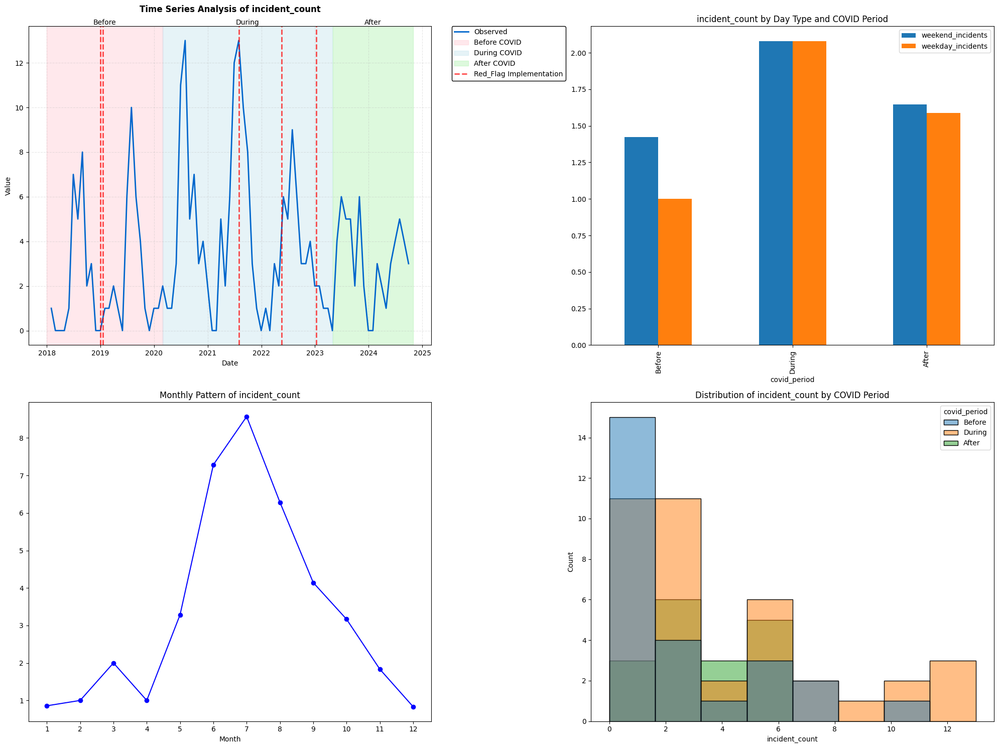

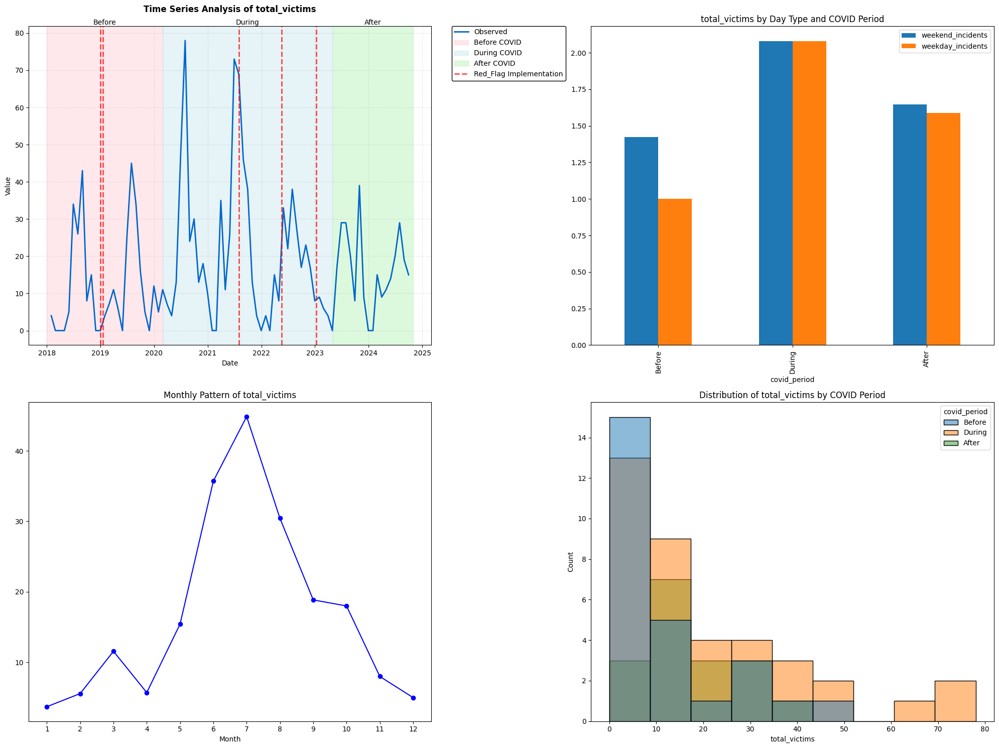

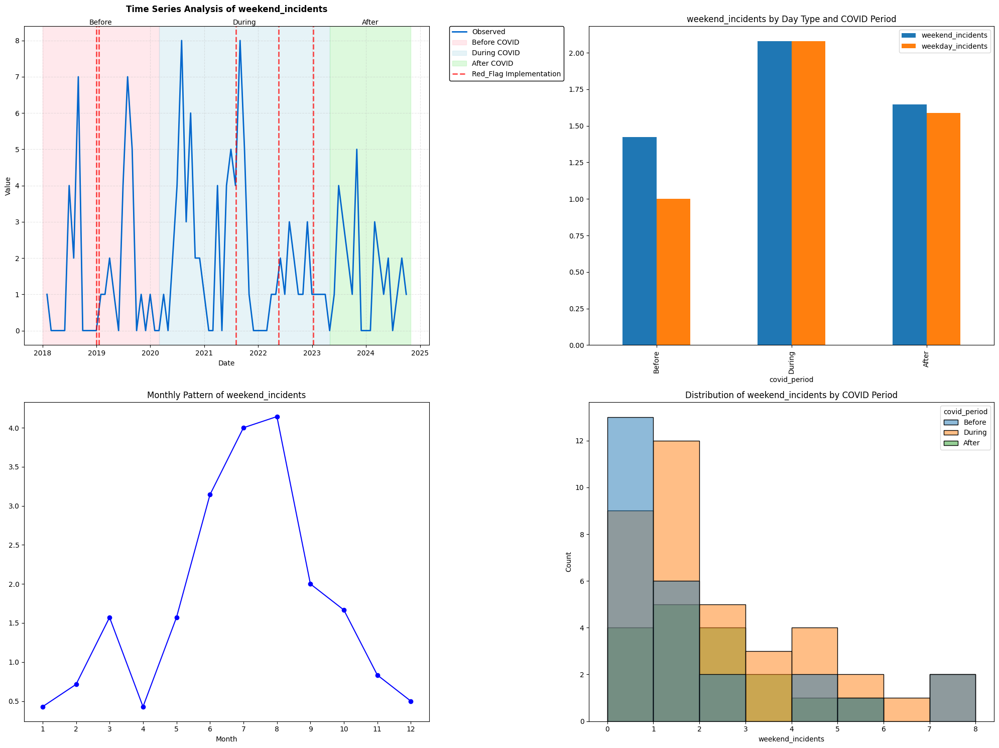

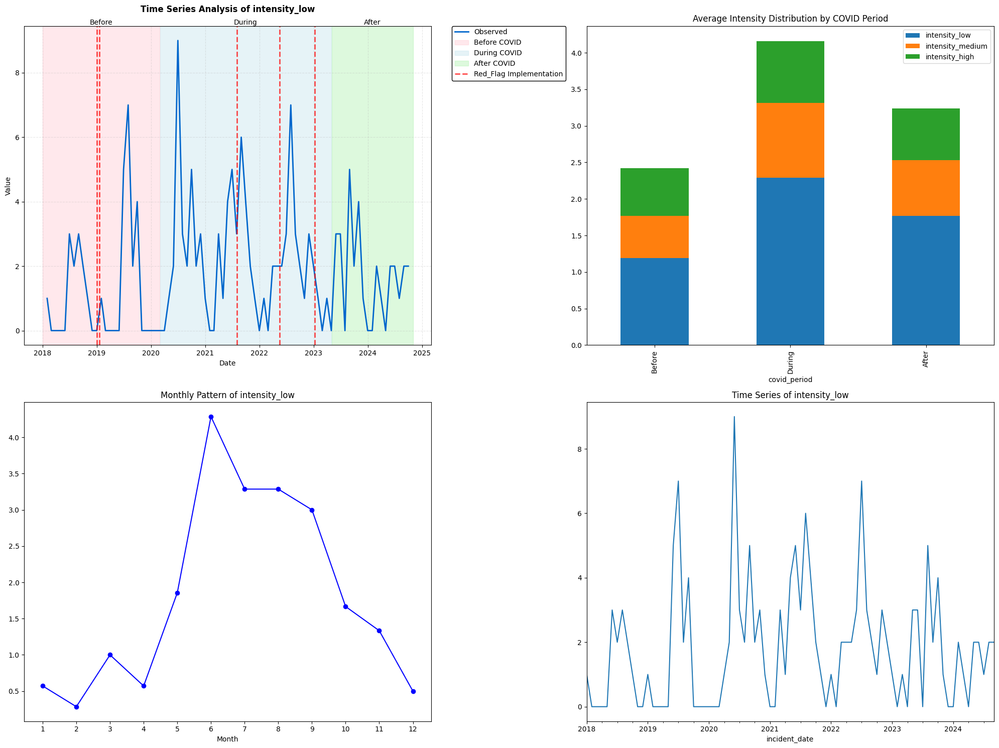

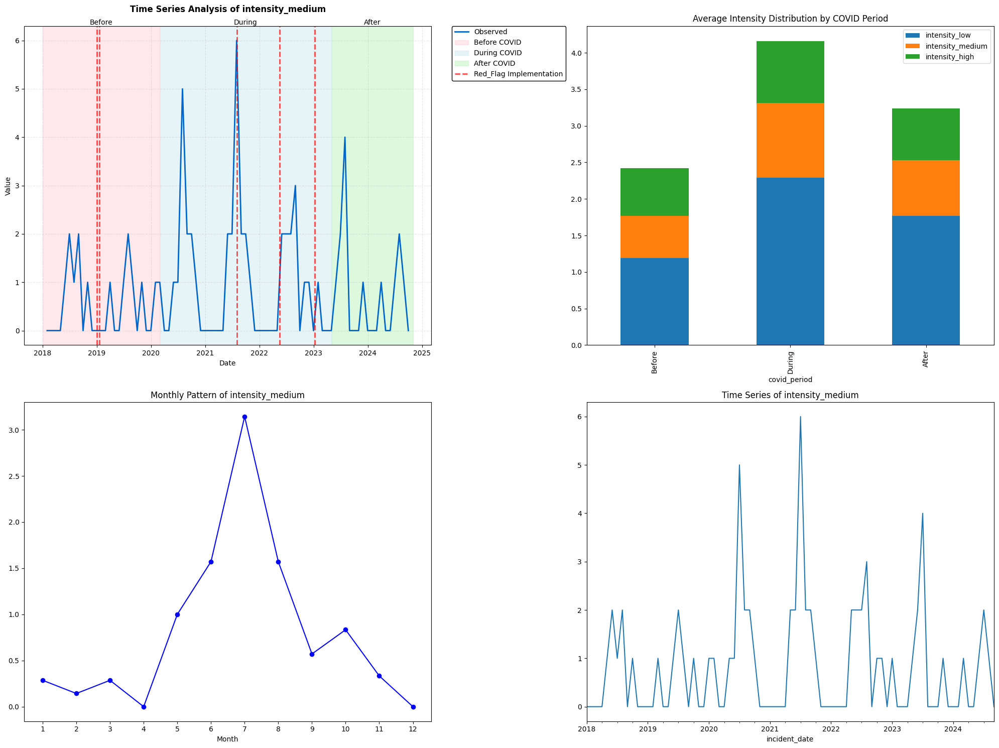

...

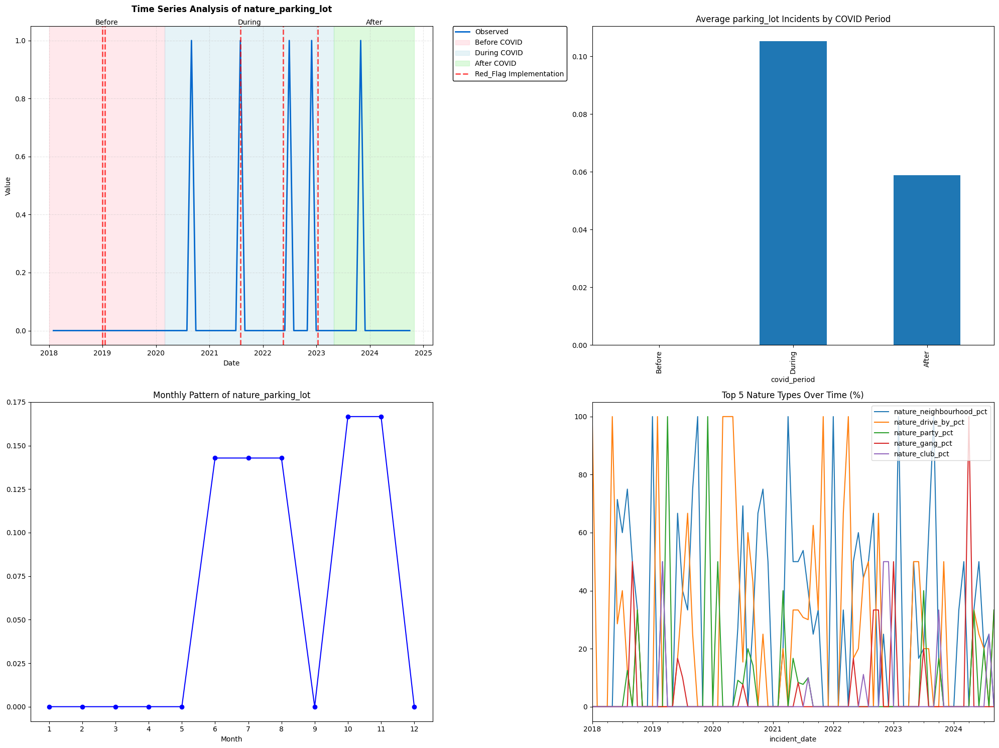

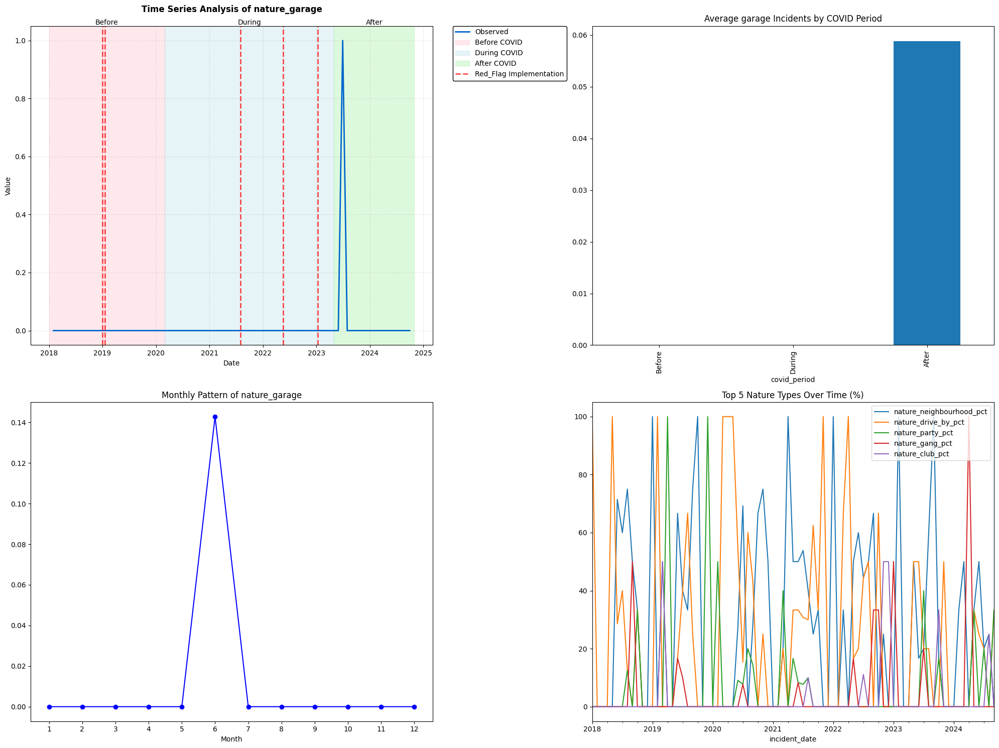

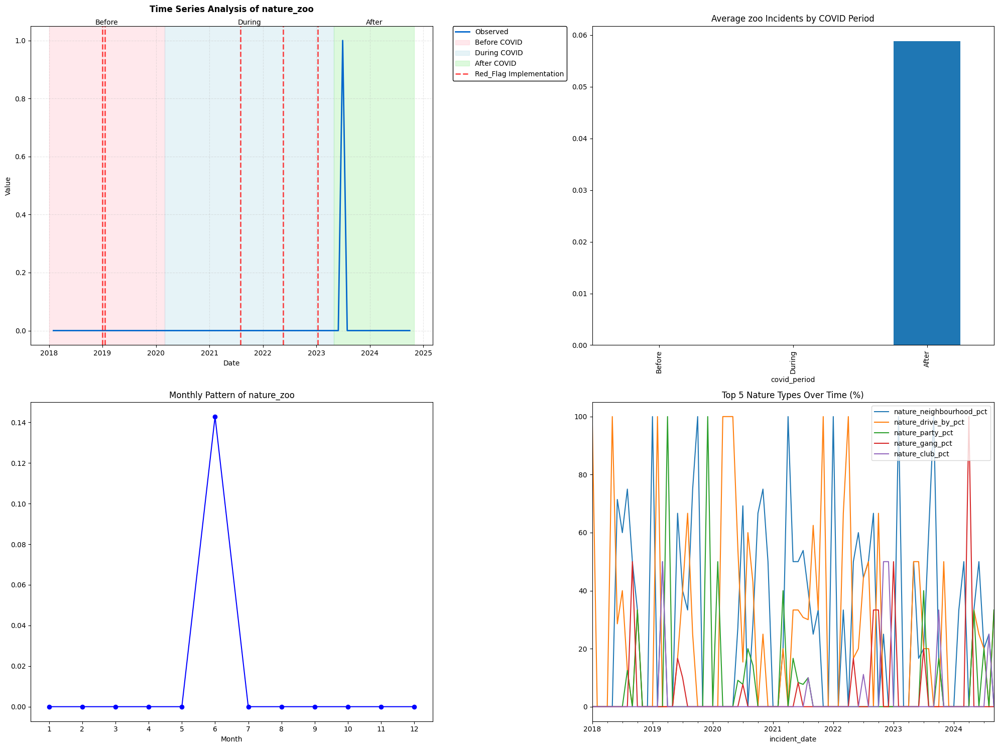

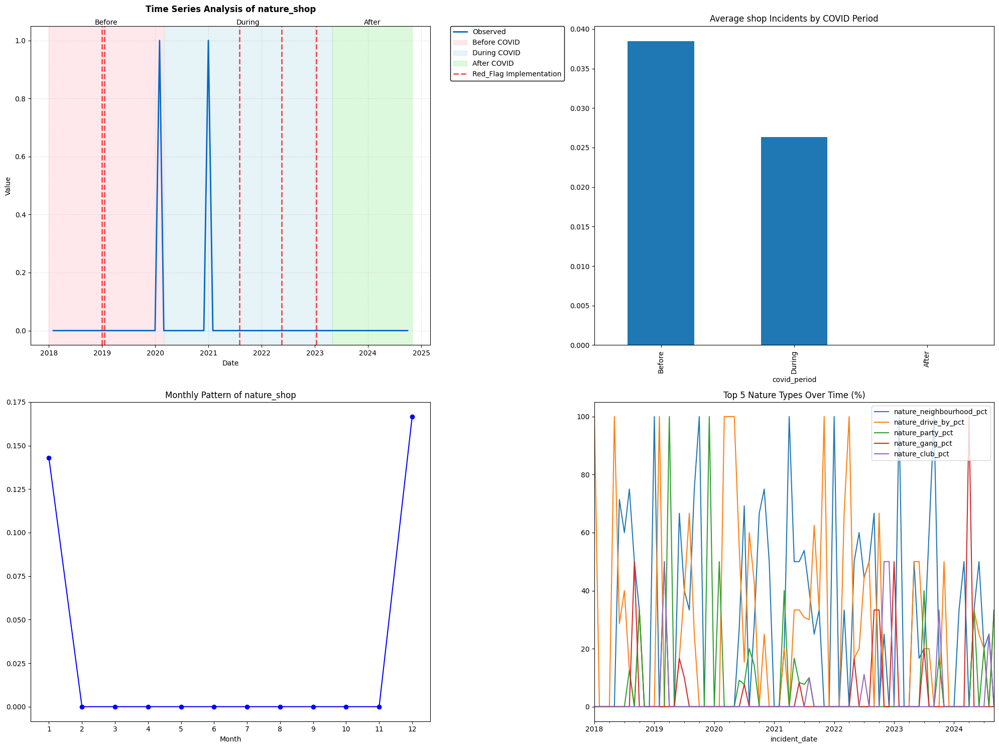

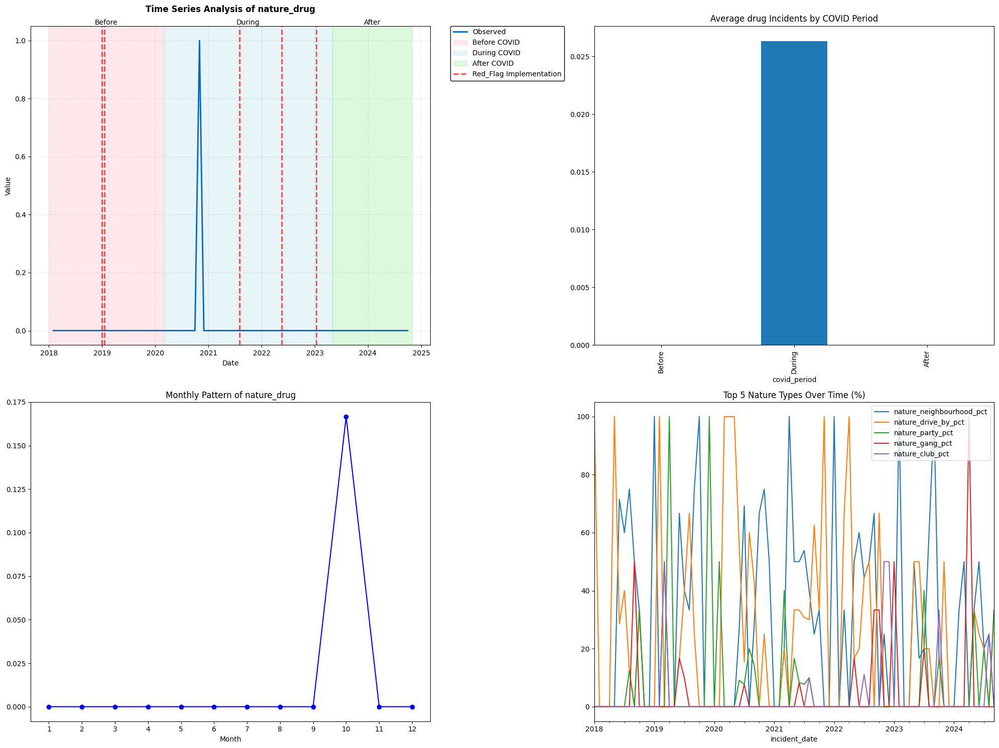

In [ ]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.statespace.structural import UnobservedComponents

class ChicagoGunViolenceITSA:
    def __init__(self, data):
        # Keep existing initialization code
        self.data = data.copy()
        self.data['incident_date'] = pd.to_datetime(self.data['incident_date'])

        # Add short-term and long-term analysis periods
        self.analysis_periods = {
            'short_term': 3,  # 3 months
            'medium_term': 6,  # 6 months
            'long_term': 12    # 12 months
        }

        # Keep existing initialization code for other attributes
        self.interventions = {
            'Red_Flag': '2019-01-01',
            'Dealer_License': '2019-01-17',
            'FOID_Modernization': '2021-08-02',
            'Ghost_Guns': '2022-05-18',
            'Assault_Weapons': '2023-01-10'
        }

        # Define COVID-19 periods with corrected dates
        self.covid_periods = {
            'Before': ('2018-01-01', '2020-02-29'),
            'During': ('2020-03-01', '2023-05-01'),
            'After': ('2023-05-02', '2024-10-31')
        }

        # Define nature categories
        self.nature_categories = [
            'drive by', 'party', 'dance studio', 'neighbourhood', 'club',
            'restaurant', 'shootout', 'gang', 'office', 'felon possession',
            'armed robbery', 'domestic violence', 'parking lot', 'garage',
            'zoo', 'shop', 'drug'
        ]

        # Add day of week
        self.data['day_of_week'] = self.data['incident_date'].dt.day_name()

        # Add weekend indicator
        self.data['is_weekend'] = self.data['day_of_week'].isin(['Saturday', 'Sunday'])

        # Convert nature to string type to avoid categorical issues
        self.data['nature'] = self.data['nature'].astype(str)

    def prepare_monthly_data(self):
        """Prepare monthly aggregated data with focus on Chicago-specific patterns"""
        monthly = pd.DataFrame()

        # Group by month
        grouped = self.data.groupby(pd.Grouper(key='incident_date', freq='ME'))

        # Core metrics
        monthly['incident_count'] = grouped.size()
        monthly['total_victims'] = grouped['total_victims'].sum()
        monthly['weekend_incidents'] = grouped.apply(lambda x: x['is_weekend'].sum(), include_groups=False)
        monthly['weekday_incidents'] = monthly['incident_count'] - monthly['weekend_incidents']

        # Intensity metrics
        for intensity in ['low', 'medium', 'high']:
            monthly[f'intensity_{intensity}'] = grouped.apply(
                lambda x: (x['intensity'] == intensity).sum(),
                include_groups=False)

        # Nature metrics for all categories
        for nature in self.nature_categories:
            monthly[f'nature_{nature.replace(" ", "_")}'] = grouped.apply(
                lambda x: (x['nature'].str.lower() == nature).sum(),
                include_groups=False)

            # Calculate percentages
            monthly[f'nature_{nature.replace(" ", "_")}_pct'] = np.where(
                monthly['incident_count'] > 0,
                (monthly[f'nature_{nature.replace(" ", "_")}'] / monthly['incident_count'] * 100),
                0
            )

        # Add seasonal indicators
        monthly['month'] = monthly.index.month
        monthly['summer_month'] = monthly['month'].isin([6, 7, 8]).astype(int)

        # Add intervention indicators
        for law, date in self.interventions.items():
            monthly[f'intervention_{law}'] = (
                monthly.index >= pd.to_datetime(date)).astype(int)
            monthly[f'time_since_{law}'] = range(len(monthly))
            monthly[f'time_since_{law}'] *= monthly[f'intervention_{law}']

        # Add COVID period indicators
        monthly['covid_period'] = pd.cut(
            monthly.index,
            bins=[pd.to_datetime(self.covid_periods[p][0]) for p in ['Before', 'During', 'After']] +
                 [pd.to_datetime('2024-12-31')],
            labels=['Before', 'During', 'After'],
            include_lowest=True
        )

        return monthly

    def analyze_temporal_patterns(self, data=None):
        """Analyze temporal patterns with focus on weekend/summer trends"""
        if data is None:
            data = self.prepare_monthly_data()

        patterns = {}

        # Analyze weekend vs weekday patterns
        patterns['weekend_ratio'] = {
            period: data[data['covid_period'] == period]['weekend_incidents'].sum() /
                   data[data['covid_period'] == period]['weekday_incidents'].sum()
            for period in ['Before', 'During', 'After']
        }

        # Analyze summer intensity
        patterns['summer_intensity'] = {
            period: {
                'summer_avg': data[(data['covid_period'] == period) &
                                 (data['summer_month'] == 1)]['incident_count'].mean(),
                'non_summer_avg': data[(data['covid_period'] == period) &
                                     (data['summer_month'] == 0)]['incident_count'].mean()
            }
            for period in ['Before', 'During', 'After']
        }

        return patterns

    def analyze_nature_distribution(self, data=None):
        """Analyze changes in incident nature distribution"""
        if data is None:
            data = self.prepare_monthly_data()

        nature_analysis = {}

        # Analyze nature distribution by period
        for period in ['Before', 'During', 'After']:
            period_data = data[
                (data['covid_period'] == period) &
                (data['incident_count'] > 0)
            ].copy()

            if len(period_data) > 0:
                nature_stats = {}
                for nature in self.nature_categories:
                    col_name = f'nature_{nature.replace(" ", "_")}_pct'
                    nature_stats[nature] = period_data[col_name].mean()
                nature_analysis[period] = nature_stats
            else:
                nature_analysis[period] = {nature: 0 for nature in self.nature_categories}

        # Analyze nature distribution by intensity
        intensity_nature = {}
        for intensity in ['low', 'medium', 'high']:
            high_incident_months = data[
                (data[f'intensity_{intensity}'] > 0) &
                (data['incident_count'] > 0)
            ].copy()

            if len(high_incident_months) > 0:
                nature_stats = {}
                for nature in self.nature_categories:
                    col_name = f'nature_{nature.replace(" ", "_")}_pct'
                    nature_stats[nature] = high_incident_months[col_name].mean()
                intensity_nature[intensity] = nature_stats
            else:
                intensity_nature[intensity] = {nature: 0 for nature in self.nature_categories}

        nature_analysis['by_intensity'] = intensity_nature

        return nature_analysis

    def analyze_law_impact(self, outcome_var, law_name, data=None):
        """Enhanced analysis considering short-term and long-term effects"""
        if data is None:
            data = self.prepare_monthly_data()

        # Base analysis remains the same for immediate effects
        base_results = super().analyze_law_impact(outcome_var, law_name, data)

        # Add temporal analysis for different periods
        temporal_results = {}

        for period_name, months in self.analysis_periods.items():
            # Create period-specific intervention indicator
            law_date = pd.to_datetime(self.interventions[law_name])
            period_end = law_date + pd.DateOffset(months=months)

            # Subset data for the specific period
            period_data = data[data.index <= period_end].copy()

            # Add period-specific intervention indicators
            period_data[f'intervention_{period_name}'] = (
                (period_data.index >= law_date) &
                (period_data.index <= period_end)
            ).astype(int)

            # Add time since intervention for this period
            period_data[f'time_since_{period_name}'] = range(len(period_data))
            period_data[f'time_since_{period_name}'] *= period_data[f'intervention_{period_name}']

            # Prepare model variables
            X = pd.DataFrame({
                'time': range(len(period_data)),
                f'intervention_{period_name}': period_data[f'intervention_{period_name}'],
                f'time_since_{period_name}': period_data[f'time_since_{period_name}'],
                'summer_month': period_data['summer_month'],
                'weekend_ratio': np.where(
                    period_data['weekday_incidents'] > 0,
                    period_data['weekend_incidents'] / period_data['weekday_incidents'],
                    0
                )
            })
            X = sm.add_constant(X)
            y = period_data[outcome_var]

            try:
                # Fit model with HAC standard errors
                model = sm.OLS(y, X).fit(cov_type='HAC', cov_kwds={'maxlags': min(months, 12)})

                # Calculate cumulative effect
                immediate_effect = model.params[f'intervention_{period_name}']
                slope_effect = model.params[f'time_since_{period_name}'] * months
                cumulative_effect = immediate_effect + slope_effect

                temporal_results[period_name] = {
                    'immediate_effect': immediate_effect,
                    'slope_effect': model.params[f'time_since_{period_name}'],
                    'cumulative_effect': cumulative_effect,
                    'p_value': model.pvalues[f'intervention_{period_name}'],
                    'r_squared': model.rsquared,
                    'model': model
                }
            except:
                temporal_results[period_name] = {
                    'immediate_effect': np.nan,
                    'slope_effect': np.nan,
                    'cumulative_effect': np.nan,
                    'p_value': np.nan,
                    'r_squared': np.nan
                }

        # Add temporal analysis to results
        base_results['temporal_analysis'] = temporal_results

        return base_results

    def plot_comprehensive_analysis(self, outcome_var):
        """Create visualization focusing on Chicago-specific patterns"""
        data = self.prepare_monthly_data()

        fig, axes = plt.subplots(2, 2, figsize=(20, 15))

        # First plot: Time series with interventions and COVID periods
        # Use darker blue for main time series
        axes[0,0].plot(data.index, data[outcome_var], color='#0066cc',
                      linewidth=2, label='Observed')

        # Add COVID period shading with more distinct colors and lower alpha
        covid_colors = {
            'Before': '#FFB6C1',  # Light pink
            'During': '#ADD8E6',  # Light blue
            'After': '#90EE90'    # Light green
        }

        # Add period labels at the center of each section
        for period, (start, end) in self.covid_periods.items():
            start_date = pd.to_datetime(start)
            end_date = pd.to_datetime(end)

            # Add shading with border
            axes[0,0].axvspan(start_date, end_date,
                            alpha=0.3,  # Increased opacity
                            color=covid_colors[period],
                            label=f'{period} COVID',
                            edgecolor='black',  # Add border
                            linewidth=1)

            # Add text label in the middle of the period
            mid_date = start_date + (end_date - start_date)/2
            axes[0,0].text(mid_date, axes[0,0].get_ylim()[1],
                          period,
                          horizontalalignment='center',
                          verticalalignment='bottom')

        # Add law implementation lines with more visibility
        for law, date in self.interventions.items():
            axes[0,0].axvline(pd.to_datetime(date),
                            color='red',
                            linestyle='--',
                            linewidth=2,
                            alpha=0.7,
                            label=f'{law} Implementation' if law == list(self.interventions.keys())[0] else '')

        # Enhance grid
        axes[0,0].grid(True, linestyle='--', alpha=0.3)

        # Enhance title and labels
        axes[0,0].set_title(f'Time Series Analysis of {outcome_var}',
                          pad=20, fontsize=12, fontweight='bold')
        axes[0,0].set_xlabel('Date', fontsize=10)
        axes[0,0].set_ylabel('Value', fontsize=10)

        # Enhance legend
        axes[0,0].legend(bbox_to_anchor=(1.05, 1),
                        loc='upper left',
                        borderaxespad=0.,
                        frameon=True,
                        framealpha=1,
                        edgecolor='black')

        # Second plot: Different for each metric type
        if 'intensity' in outcome_var:
            # Intensity distribution across COVID periods
            intensity_data = data.groupby('covid_period')[['intensity_low', 'intensity_medium', 'intensity_high']].mean()
            intensity_data.plot(kind='bar', stacked=True, ax=axes[0,1])
            axes[0,1].set_title('Average Intensity Distribution by COVID Period')

        elif 'nature' in outcome_var:
            # Nature type distribution for specific nature
            nature_type = outcome_var.replace('nature_', '').replace('_incidents', '')
            nature_by_period = data.groupby('covid_period')[outcome_var].mean()
            nature_by_period.plot(kind='bar', ax=axes[0,1])
            axes[0,1].set_title(f'Average {nature_type} Incidents by COVID Period')

        else:
            # General metric by weekend/weekday
            weekend_data = data.groupby('covid_period')[['weekend_incidents', 'weekday_incidents']].mean()
            weekend_data.plot(kind='bar', ax=axes[0,1])
            axes[0,1].set_title(f'{outcome_var} by Day Type and COVID Period')

        # Third plot: Seasonal patterns
        monthly_avg = data.groupby('month')[outcome_var].mean()
        axes[1,0].plot(monthly_avg.index, monthly_avg.values, 'b-', marker='o')
        axes[1,0].set_title(f'Monthly Pattern of {outcome_var}')
        axes[1,0].set_xticks(range(1, 13))
        axes[1,0].set_xlabel('Month')

        # Fourth plot: Specific analysis based on metric type
        if 'intensity' in outcome_var:
            # Time series of this specific intensity
            data[outcome_var].plot(ax=axes[1,1])
            axes[1,1].set_title(f'Time Series of {outcome_var}')

        elif 'nature' in outcome_var:
            # Top nature types over time
            nature_cols = [col for col in data.columns if col.endswith('_pct')]
            top_natures = data[nature_cols].mean().nlargest(5)
            data[top_natures.index].plot(ax=axes[1,1])
            axes[1,1].set_title('Top 5 Nature Types Over Time (%)')

        else:
            # Distribution of values
            sns.histplot(data=data, x=outcome_var, hue='covid_period', ax=axes[1,1])
            axes[1,1].set_title(f'Distribution of {outcome_var} by COVID Period')

        plt.tight_layout()
        return fig

    def run_comprehensive_analysis(self):
        """Run complete analysis with focus on Chicago-specific patterns"""
        monthly_data = self.prepare_monthly_data()

        results = {
            'temporal_patterns': self.analyze_temporal_patterns(monthly_data),
            'nature_distribution': self.analyze_nature_distribution(monthly_data),
            'law_impacts': {},
            'visualizations': {}
        }

        # Define key metrics based on observations
        metrics = [
            'incident_count', 'total_victims',
            'weekend_incidents', 'intensity_low', 'intensity_medium', 'intensity_high'
        ]

        # Add nature metrics
        for nature in self.nature_categories:
            metrics.append(f'nature_{nature.replace(" ", "_")}')

        # Analyze each metric
        for metric in metrics:
            print(f"\nAnalyzing {metric}")
            print("=" * 50)

            # Analyze impact of each law
            law_results = {}
            for law in self.interventions.items():
                law_results[law[0]] = self.analyze_law_impact(metric, law[0], monthly_data)
            results['law_impacts'][metric] = law_results

            # Create visualization
            results['visualizations'][metric] = self.plot_comprehensive_analysis(metric)

            # Print temporal patterns
            print("\nTemporal Patterns:")
            print("Weekend vs Weekday Ratio:")
            for period, ratio in results['temporal_patterns']['weekend_ratio'].items():
                print(f"  {period}: {ratio:.2f}")

            print("\nSummer Intensity:")
            for period, stats in results['temporal_patterns']['summer_intensity'].items():
                print(f"  {period}:")
                print(f"    Summer average: {stats['summer_avg']:.2f}")
                print(f"    Non-summer average: {stats['non_summer_avg']:.2f}")

            print("\nNature Distribution:")
            for period, dist in results['nature_distribution'].items():
                if period != 'by_intensity':
                    print(f"  {period}:")
                    # Print top 5 nature types by percentage
                    sorted_natures = sorted(dist.items(), key=lambda x: x[1], reverse=True)[:5]
                    for nature, pct in sorted_natures:
                        print(f"    {nature}: {pct:.1f}%")

            print("\nLaw Impact Analysis:")
            for law, impact in law_results.items():
                print(f"{law}:")
                print(f"  Immediate effect: {impact['immediate_effect']:.2f}")
                print(f"  Percentage change: {impact['pct_change']:.1f}%")
                print(f"  Summer effect: {impact['summer_effect']:.2f}")
                print(f"  Weekend effect: {impact['weekend_effect']:.2f}")
                print(f"  p-value: {impact['p_value']:.4f}")

        return results

# Create the analyzer instance
analyzer = ChicagoGunViolenceITSA(sub_dataset)

# If you want to suppress warnings
import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")

    # Run the complete analysis
    results = analyzer.run_comprehensive_analysis()


Analyzing incident_count

Temporal Patterns:
Weekend vs Weekday Ratio:
  Before: 1.39
  During: 1.32
  After: 1.00

Summer Intensity:
  Before:
    Summer average: 7.67
    Non-summer average: 1.65
  During:
    Summer average: 11.78
    Non-summer average: 3.79
  After:
    Summer average: 6.67
    Non-summer average: 3.27

Nature Distribution:
  Before:
    neighbourhood: 38.6%
    drive by: 27.2%
    party: 11.5%
    shop: 4.8%
    club: 4.0%
  During:
    neighbourhood: 35.2%
    drive by: 25.3%
    party: 9.1%
    club: 5.9%
    gang: 4.4%
  After:
    neighbourhood: 28.1%
    domestic violence: 16.8%
    drive by: 16.0%
    party: 10.2%
    gang: 5.9%

Law Impact Analysis:

Red_Flag:
  Immediate effect: 1.77
  Percentage change: 60.5%

  Temporal Effects:
    short_term:
      Immediate effect: -6.32
      Slope effect: 0.52
      Cumulative effect: -4.77
      p-value: 0.0000
    medium_term:
      Immediate effect: 2.49
      Slope effect: -0.17
      Cumulative effect: 1.48
 

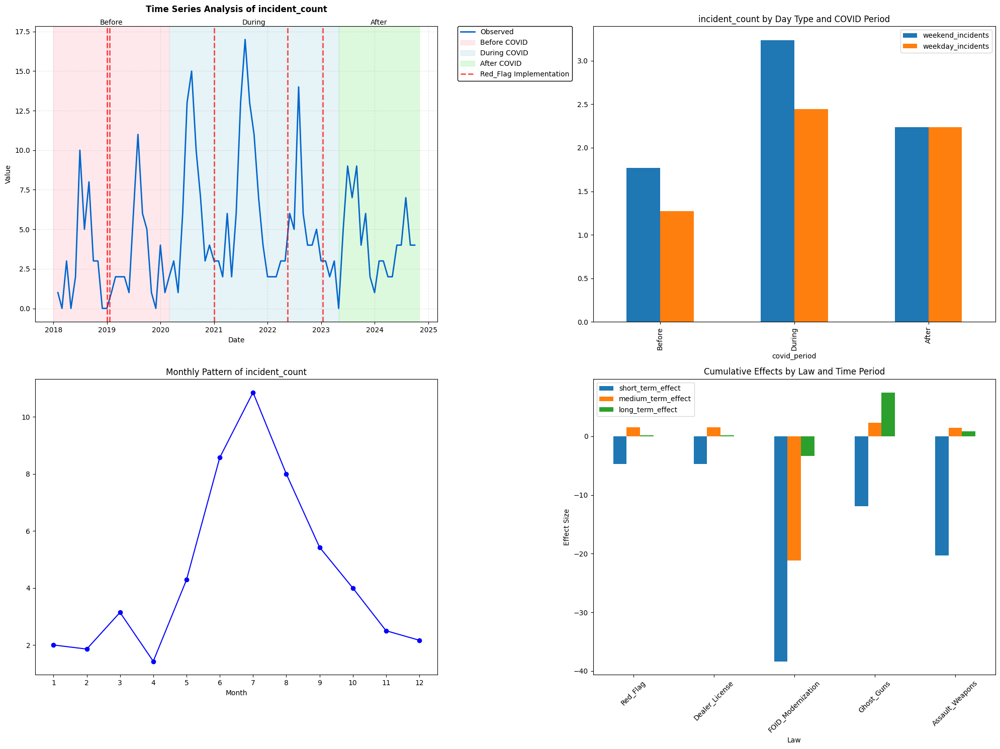

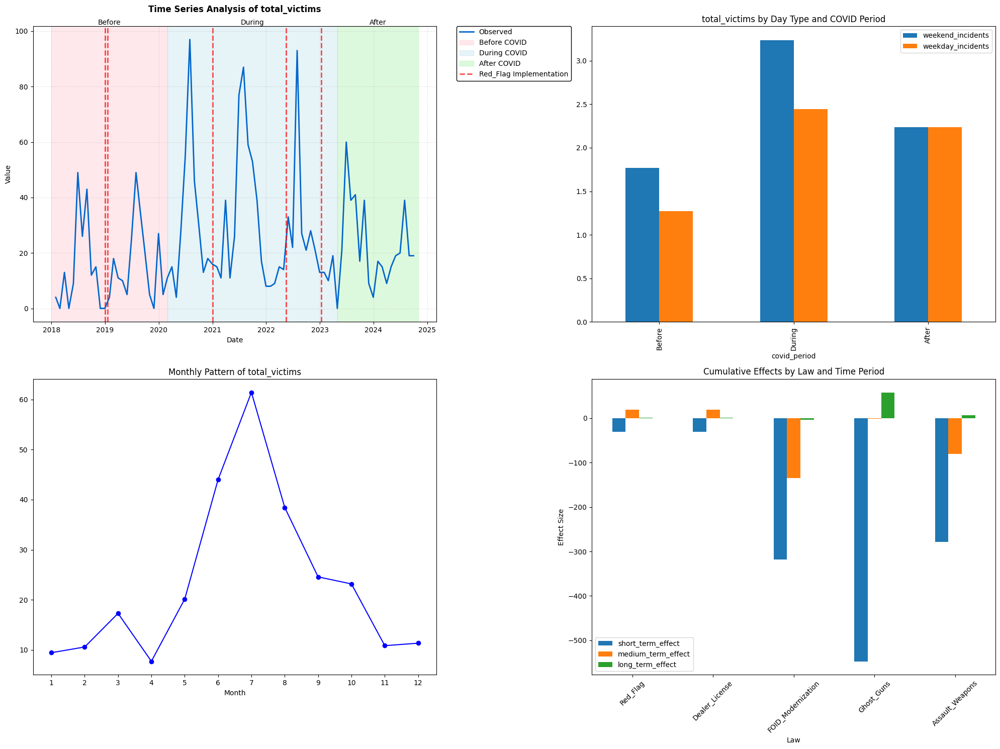

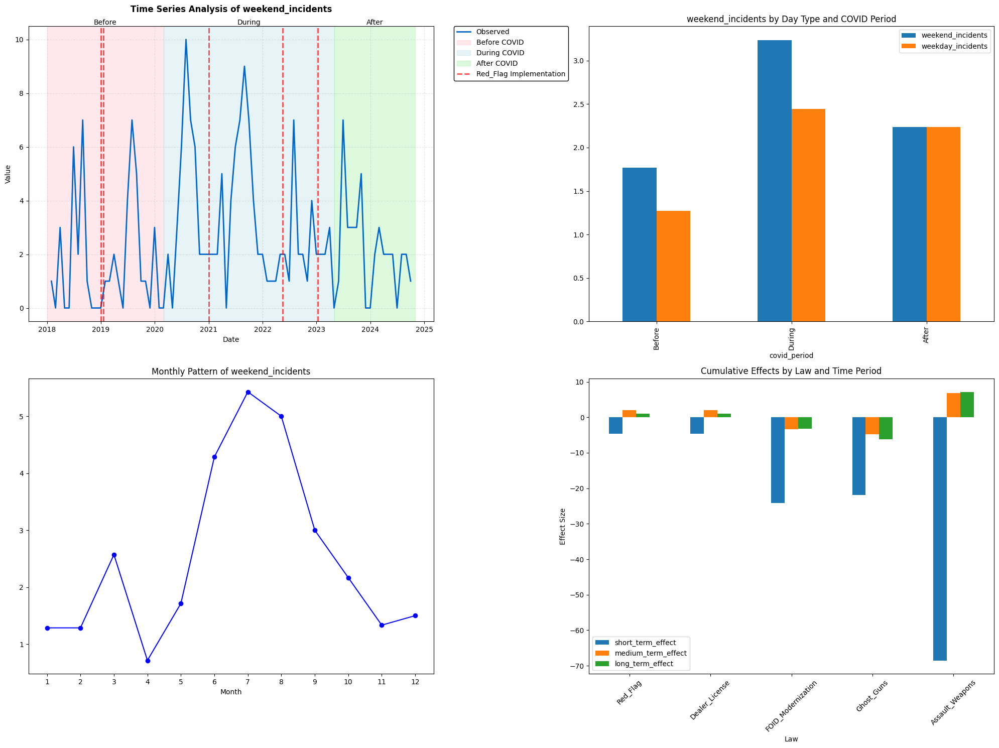

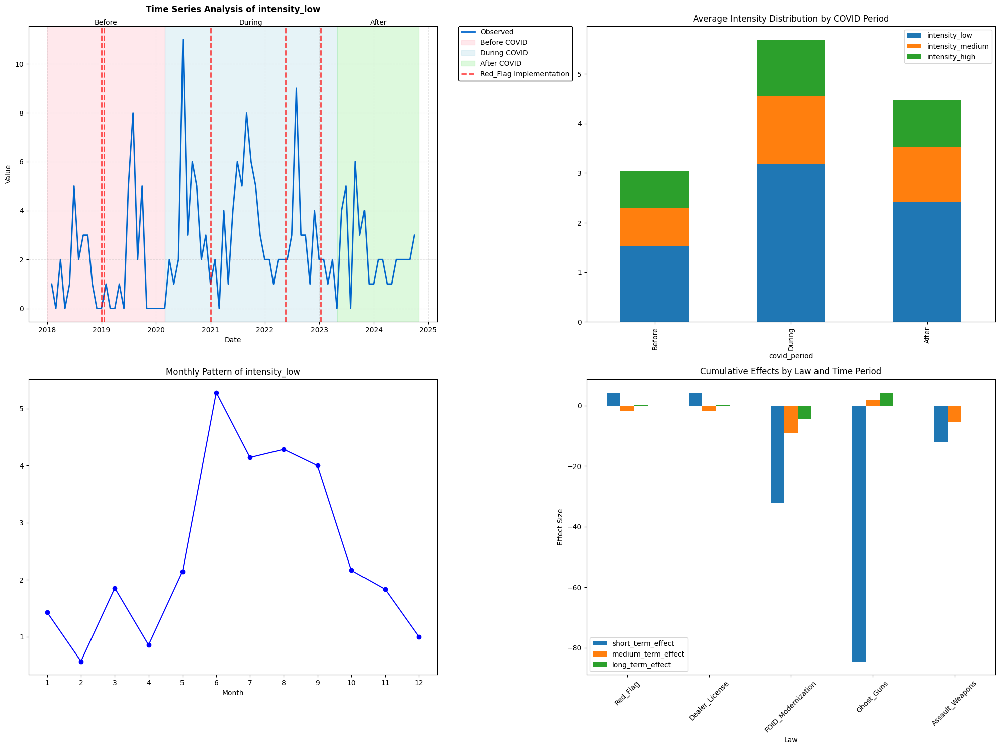

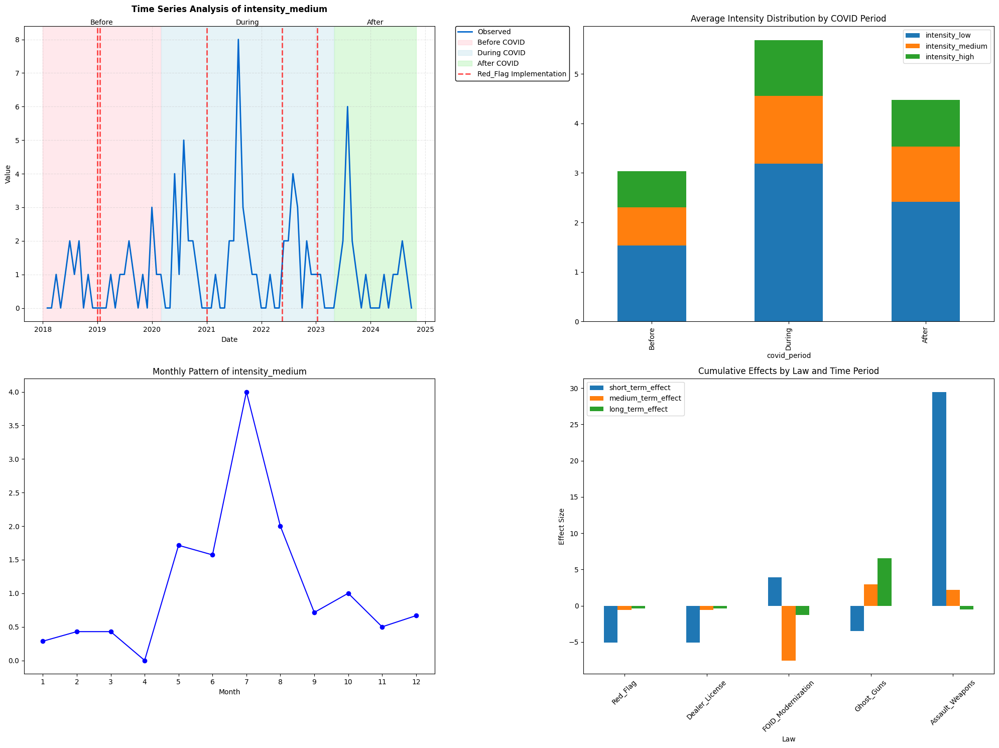

...

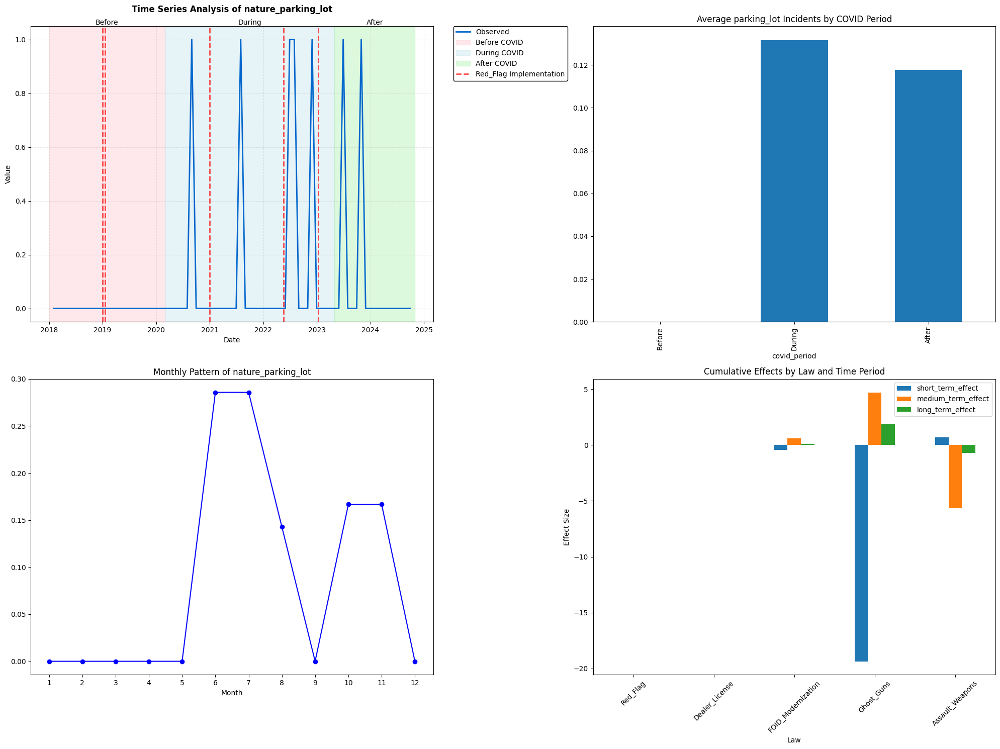

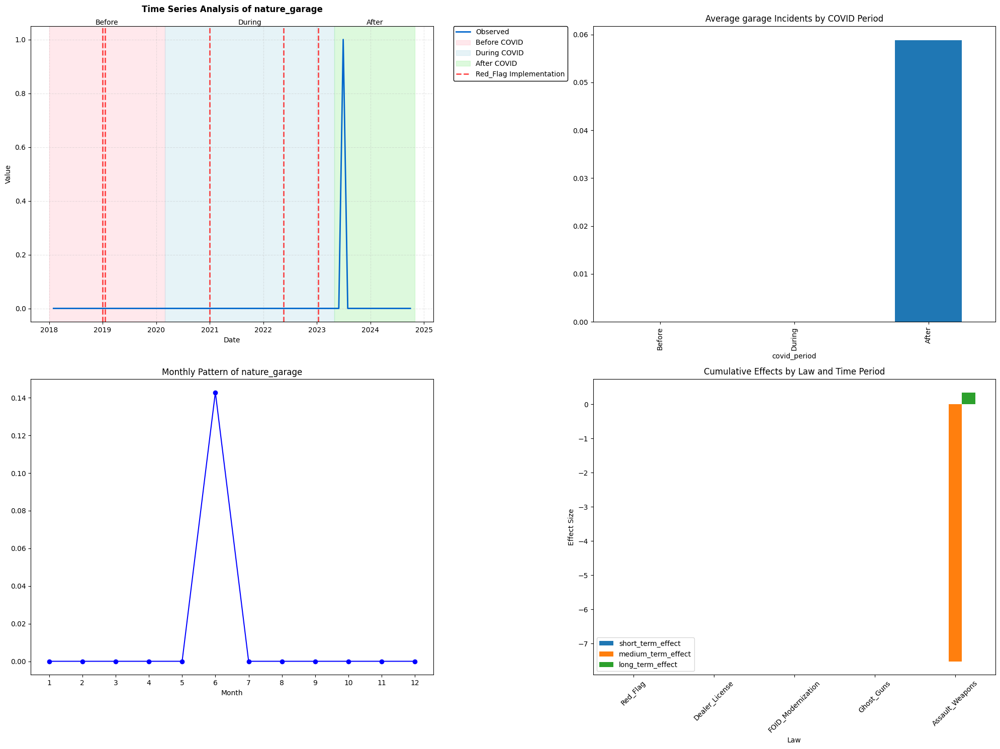

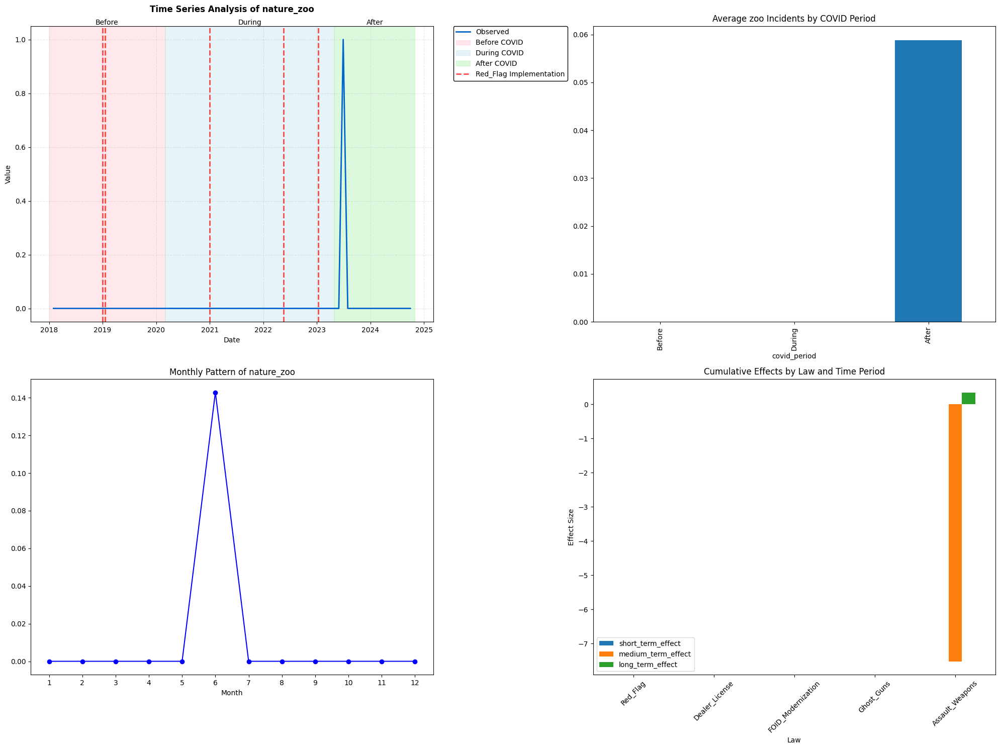

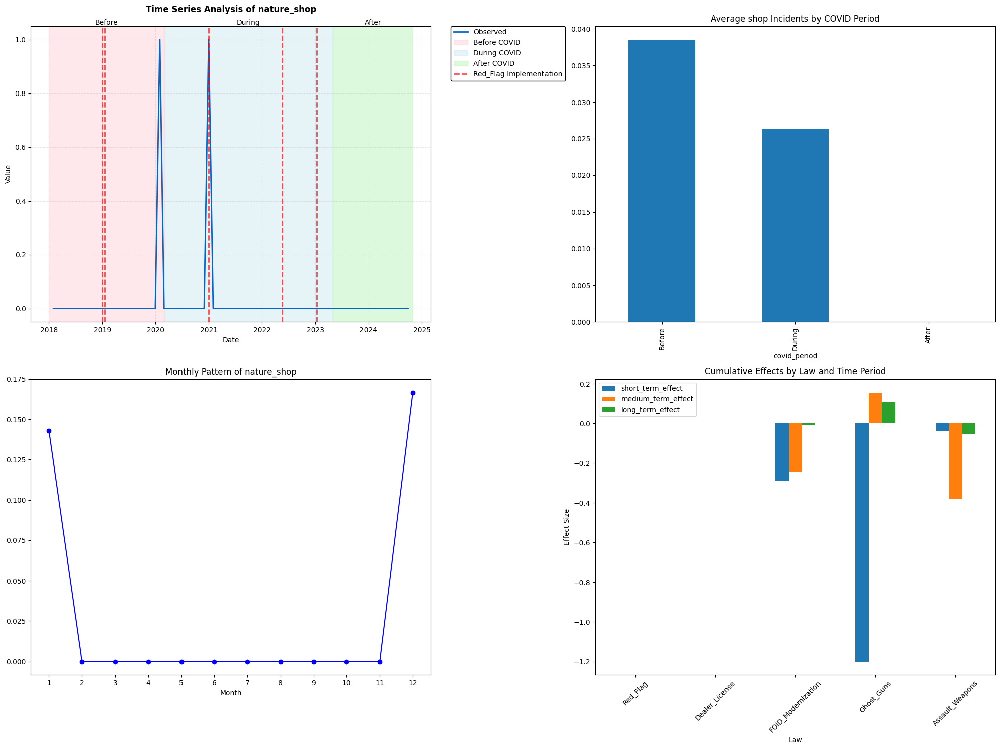

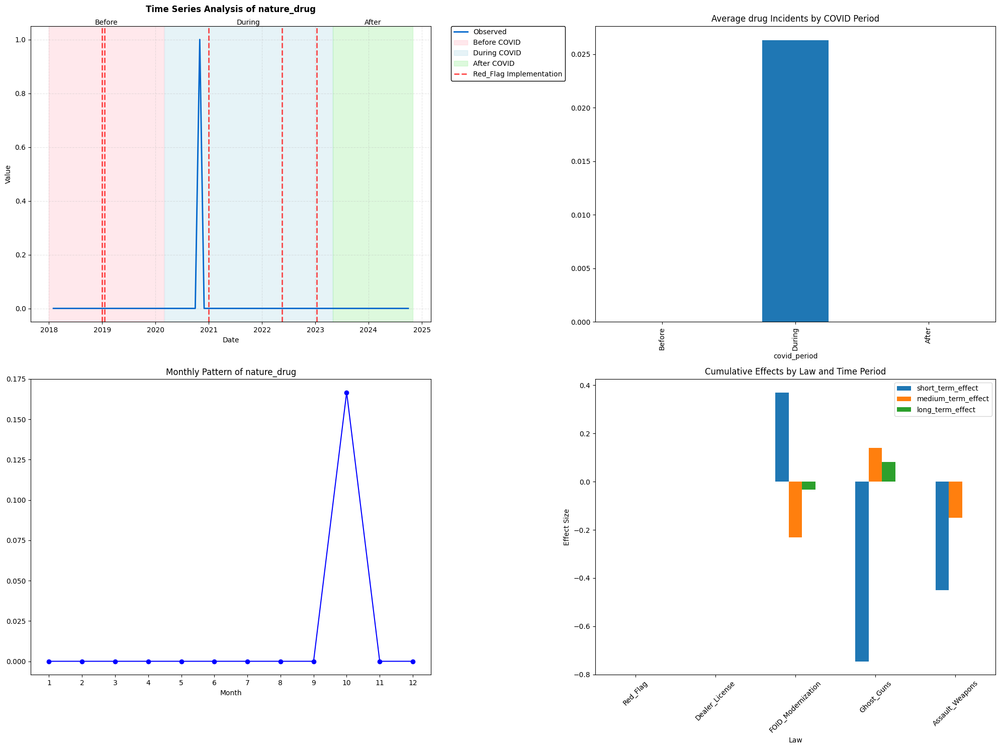

In [ ]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.statespace.structural import UnobservedComponents

class ChicagoGunViolenceITSA:
    def __init__(self, data):
        self.data = data.copy()
        self.data['incident_date'] = pd.to_datetime(self.data['incident_date'])

        # Define intervention dates for each law
        self.interventions = {
            'Red_Flag': '2019-01-01',
            'Dealer_License': '2019-01-18',
            'FOID_Modernization': '2021-01-01',
            'Ghost_Guns': '2022-05-18',
            'Assault_Weapons': '2023-01-10'
        }

        # Add short-term and long-term analysis periods
        self.analysis_periods = {
            'short_term': 3,  # 3 months
            'medium_term': 6,  # 6 months
            'long_term': 12    # 12 months
        }

        # Define COVID-19 periods with corrected dates
        self.covid_periods = {
            'Before': ('2018-01-01', '2020-02-29'),
            'During': ('2020-03-01', '2023-05-01'),
            'After': ('2023-05-02', '2024-10-31')
        }

        # Define nature categories
        self.nature_categories = [
            'drive by', 'party', 'dance studio', 'neighbourhood', 'club',
            'restaurant', 'shootout', 'gang', 'office', 'felon possession',
            'armed robbery', 'domestic violence', 'parking lot', 'garage',
            'zoo', 'shop', 'drug'
        ]

        # Add day of week
        self.data['day_of_week'] = self.data['incident_date'].dt.day_name()

        # Add weekend indicator
        self.data['is_weekend'] = self.data['day_of_week'].isin(['Saturday', 'Sunday'])

        # Convert nature to string type to avoid categorical issues
        self.data['nature'] = self.data['nature'].astype(str)

    def prepare_monthly_data(self):
        """Prepare monthly aggregated data with focus on Chicago-specific patterns"""
        monthly = pd.DataFrame()

        # Group by month
        grouped = self.data.groupby(pd.Grouper(key='incident_date', freq='ME'))

        # Core metrics
        monthly['incident_count'] = grouped.size()
        monthly['total_victims'] = grouped['total_victims'].sum()
        monthly['weekend_incidents'] = grouped.apply(lambda x: x['is_weekend'].sum(), include_groups=False)
        monthly['weekday_incidents'] = monthly['incident_count'] - monthly['weekend_incidents']

        # Intensity metrics
        for intensity in ['low', 'medium', 'high']:
            monthly[f'intensity_{intensity}'] = grouped.apply(
                lambda x: (x['intensity'] == intensity).sum(),
                include_groups=False)

        # Nature metrics for all categories
        for nature in self.nature_categories:
            monthly[f'nature_{nature.replace(" ", "_")}'] = grouped.apply(
                lambda x: (x['nature'].str.lower() == nature).sum(),
                include_groups=False)

            # Calculate percentages
            monthly[f'nature_{nature.replace(" ", "_")}_pct'] = np.where(
                monthly['incident_count'] > 0,
                (monthly[f'nature_{nature.replace(" ", "_")}'] / monthly['incident_count'] * 100),
                0
            )

        # Add seasonal indicators
        monthly['month'] = monthly.index.month
        monthly['summer_month'] = monthly['month'].isin([6, 7, 8]).astype(int)

        # Add intervention indicators
        for law, date in self.interventions.items():
            monthly[f'intervention_{law}'] = (
                monthly.index >= pd.to_datetime(date)).astype(int)
            monthly[f'time_since_{law}'] = range(len(monthly))
            monthly[f'time_since_{law}'] *= monthly[f'intervention_{law}']

        # Add COVID period indicators
        monthly['covid_period'] = pd.cut(
            monthly.index,
            bins=[pd.to_datetime(self.covid_periods[p][0]) for p in ['Before', 'During', 'After']] +
                 [pd.to_datetime('2024-12-31')],
            labels=['Before', 'During', 'After'],
            include_lowest=True
        )

        return monthly

    def analyze_temporal_patterns(self, data=None):
        """Analyze temporal patterns with focus on weekend/summer trends"""
        if data is None:
            data = self.prepare_monthly_data()

        patterns = {}

        # Analyze weekend vs weekday patterns
        patterns['weekend_ratio'] = {
            period: data[data['covid_period'] == period]['weekend_incidents'].sum() /
                   data[data['covid_period'] == period]['weekday_incidents'].sum()
            for period in ['Before', 'During', 'After']
        }

        # Analyze summer intensity
        patterns['summer_intensity'] = {
            period: {
                'summer_avg': data[(data['covid_period'] == period) &
                                 (data['summer_month'] == 1)]['incident_count'].mean(),
                'non_summer_avg': data[(data['covid_period'] == period) &
                                     (data['summer_month'] == 0)]['incident_count'].mean()
            }
            for period in ['Before', 'During', 'After']
        }

        return patterns

    def analyze_nature_distribution(self, data=None):
        """Analyze changes in incident nature distribution"""
        if data is None:
            data = self.prepare_monthly_data()

        nature_analysis = {}

        # Analyze nature distribution by period
        for period in ['Before', 'During', 'After']:
            period_data = data[
                (data['covid_period'] == period) &
                (data['incident_count'] > 0)
            ].copy()

            if len(period_data) > 0:
                nature_stats = {}
                for nature in self.nature_categories:
                    col_name = f'nature_{nature.replace(" ", "_")}_pct'
                    nature_stats[nature] = period_data[col_name].mean()
                nature_analysis[period] = nature_stats
            else:
                nature_analysis[period] = {nature: 0 for nature in self.nature_categories}

        # Analyze nature distribution by intensity
        intensity_nature = {}
        for intensity in ['low', 'medium', 'high']:
            high_incident_months = data[
                (data[f'intensity_{intensity}'] > 0) &
                (data['incident_count'] > 0)
            ].copy()

            if len(high_incident_months) > 0:
                nature_stats = {}
                for nature in self.nature_categories:
                    col_name = f'nature_{nature.replace(" ", "_")}_pct'
                    nature_stats[nature] = high_incident_months[col_name].mean()
                intensity_nature[intensity] = nature_stats
            else:
                intensity_nature[intensity] = {nature: 0 for nature in self.nature_categories}

        nature_analysis['by_intensity'] = intensity_nature

        return nature_analysis

    def analyze_law_impact(self, outcome_var, law_name, data=None):
        """Analyze law impact with consideration for temporal patterns"""
        if data is None:
            data = self.prepare_monthly_data()

        # Base analysis for immediate effects
        base_results = {
            'law': law_name,
            'outcome': outcome_var,
            'immediate_effect': 0,
            'slope_change': 0,
            'p_value': np.nan,
            'r_squared': 0,
            'baseline': 0,
            'pct_change': 0,
            'summer_effect': 0,
            'weekend_effect': 0
        }

        if data[outcome_var].sum() == 0:
            return base_results

        # Prepare base model variables
        X = pd.DataFrame({
            'time': range(len(data)),
            'intervention': data[f'intervention_{law_name}'],
            'time_since': data[f'time_since_{law_name}'],
            'summer_month': data['summer_month'],
            'weekend_ratio': np.where(
                data['weekday_incidents'] > 0,
                data['weekend_incidents'] / data['weekday_incidents'],
                0
            )
        })
        X = sm.add_constant(X)
        y = data[outcome_var]

        try:
            # Fit base model with HAC standard errors
            base_model = sm.OLS(y, X).fit(cov_type='HAC', cov_kwds={'maxlags': 12})

            base_results.update({
                'immediate_effect': base_model.params['intervention'],
                'slope_change': base_model.params['time_since'],
                'p_value': base_model.pvalues['intervention'],
                'r_squared': base_model.rsquared,
                'baseline': y[data[f'intervention_{law_name}'] == 0].mean(),
                'summer_effect': base_model.params['summer_month'],
                'weekend_effect': base_model.params['weekend_ratio']
            })

            base_results['pct_change'] = (base_results['immediate_effect'] / base_results['baseline'] * 100) if base_results['baseline'] > 0 else 0

        except:
            pass

        # Add temporal analysis
        temporal_results = {}

        for period_name, months in self.analysis_periods.items():
            # Create period-specific intervention indicator
            law_date = pd.to_datetime(self.interventions[law_name])
            period_end = law_date + pd.DateOffset(months=months)

            # Subset data for the specific period
            period_data = data[data.index <= period_end].copy()

            # Add period-specific intervention indicators
            period_data[f'intervention_{period_name}'] = (
                (period_data.index >= law_date) &
                (period_data.index <= period_end)
            ).astype(int)

            # Add time since intervention for this period
            period_data[f'time_since_{period_name}'] = range(len(period_data))
            period_data[f'time_since_{period_name}'] *= period_data[f'intervention_{period_name}']

            # Prepare model variables
            X_period = pd.DataFrame({
                'time': range(len(period_data)),
                f'intervention_{period_name}': period_data[f'intervention_{period_name}'],
                f'time_since_{period_name}': period_data[f'time_since_{period_name}'],
                'summer_month': period_data['summer_month'],
                'weekend_ratio': np.where(
                    period_data['weekday_incidents'] > 0,
                    period_data['weekend_incidents'] / period_data['weekday_incidents'],
                    0
                )
            })
            X_period = sm.add_constant(X_period)
            y_period = period_data[outcome_var]

            try:
                # Fit model with HAC standard errors
                period_model = sm.OLS(y_period, X_period).fit(cov_type='HAC',
                                                            cov_kwds={'maxlags': min(months, 12)})

                # Calculate cumulative effect
                immediate_effect = period_model.params[f'intervention_{period_name}']
                slope_effect = period_model.params[f'time_since_{period_name}'] * months
                cumulative_effect = immediate_effect + slope_effect

                temporal_results[period_name] = {
                    'immediate_effect': immediate_effect,
                    'slope_effect': period_model.params[f'time_since_{period_name}'],
                    'cumulative_effect': cumulative_effect,
                    'p_value': period_model.pvalues[f'intervention_{period_name}'],
                    'r_squared': period_model.rsquared,
                    'model': period_model
                }
            except:
                temporal_results[period_name] = {
                    'immediate_effect': np.nan,
                    'slope_effect': np.nan,
                    'cumulative_effect': np.nan,
                    'p_value': np.nan,
                    'r_squared': np.nan,
                    'model': None
                }

        # Add temporal analysis to results
        base_results['temporal_analysis'] = temporal_results

        return base_results

    def plot_comprehensive_analysis(self, outcome_var):
        """Create visualization focusing on Chicago-specific patterns"""
        data = self.prepare_monthly_data()

        fig, axes = plt.subplots(2, 2, figsize=(20, 15))

        # First plot: Time series with interventions and COVID periods
        axes[0,0].plot(data.index, data[outcome_var], color='#0066cc',
                      linewidth=2, label='Observed')

        # Add COVID period shading
        covid_colors = {
            'Before': '#FFB6C1',  # Light pink
            'During': '#ADD8E6',  # Light blue
            'After': '#90EE90'    # Light green
        }

        for period, (start, end) in self.covid_periods.items():
            start_date = pd.to_datetime(start)
            end_date = pd.to_datetime(end)

            axes[0,0].axvspan(start_date, end_date,
                            alpha=0.3,
                            color=covid_colors[period],
                            label=f'{period} COVID',
                            edgecolor='black',
                            linewidth=1)

            mid_date = start_date + (end_date - start_date)/2
            axes[0,0].text(mid_date, axes[0,0].get_ylim()[1],
                          period,
                          horizontalalignment='center',
                          verticalalignment='bottom')

        # Add law implementation lines
        for law, date in self.interventions.items():
            axes[0,0].axvline(pd.to_datetime(date),
                            color='red',
                            linestyle='--',
                            linewidth=2,
                            alpha=0.7,
                            label=f'{law} Implementation' if law == list(self.interventions.keys())[0] else '')

        axes[0,0].grid(True, linestyle='--', alpha=0.3)
        axes[0,0].set_title(f'Time Series Analysis of {outcome_var}',
                          pad=20, fontsize=12, fontweight='bold')
        axes[0,0].set_xlabel('Date', fontsize=10)
        axes[0,0].set_ylabel('Value', fontsize=10)
        axes[0,0].legend(bbox_to_anchor=(1.05, 1),
                        loc='upper left',
                        borderaxespad=0.,
                        frameon=True,
                        framealpha=1,
                        edgecolor='black')

        # Second plot: Different for each metric type
        if 'intensity' in outcome_var:
            # Intensity distribution across COVID periods
            intensity_data = data.groupby('covid_period')[['intensity_low', 'intensity_medium', 'intensity_high']].mean()
            intensity_data.plot(kind='bar', stacked=True, ax=axes[0,1])
            axes[0,1].set_title('Average Intensity Distribution by COVID Period')

        elif 'nature' in outcome_var:
            # Nature type distribution for specific nature
            nature_type = outcome_var.replace('nature_', '').replace('_incidents', '')
            nature_by_period = data.groupby('covid_period')[outcome_var].mean()
            nature_by_period.plot(kind='bar', ax=axes[0,1])
            axes[0,1].set_title(f'Average {nature_type} Incidents by COVID Period')

        else:
            # General metric by weekend/weekday
            weekend_data = data.groupby('covid_period')[['weekend_incidents', 'weekday_incidents']].mean()
            weekend_data.plot(kind='bar', ax=axes[0,1])
            axes[0,1].set_title(f'{outcome_var} by Day Type and COVID Period')

        # Third plot: Seasonal patterns
        monthly_avg = data.groupby('month')[outcome_var].mean()
        axes[1,0].plot(monthly_avg.index, monthly_avg.values, 'b-', marker='o')
        axes[1,0].set_title(f'Monthly Pattern of {outcome_var}')
        axes[1,0].set_xticks(range(1, 13))
        axes[1,0].set_xlabel('Month')

        # Fourth plot: Temporal effects across different time periods
        temporal_effects = pd.DataFrame()
        for law in self.interventions:
            impact = self.analyze_law_impact(outcome_var, law, data)
            if 'temporal_analysis' in impact:
                for period, effects in impact['temporal_analysis'].items():
                    temporal_effects.loc[law, f'{period}_effect'] = effects['cumulative_effect']

        if not temporal_effects.empty:
            temporal_effects.plot(kind='bar', ax=axes[1,1])
            axes[1,1].set_title('Cumulative Effects by Law and Time Period')
            axes[1,1].set_xlabel('Law')
            axes[1,1].set_ylabel('Effect Size')
            axes[1,1].tick_params(axis='x', rotation=45)

        plt.tight_layout()
        return fig

    def plot_temporal_effects(self, outcome_var, law_name):
        """Plot the temporal effects of a law intervention"""
        data = self.prepare_monthly_data()
        law_date = pd.to_datetime(self.interventions[law_name])

        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 12))

        # Plot 1: Actual vs Predicted Values
        ax1.plot(data.index, data[outcome_var], 'b-', label='Observed', alpha=0.7)

        # Plot predictions for each period
        colors = {'short_term': 'red', 'medium_term': 'green', 'long_term': 'purple'}

        for period_name, months in self.analysis_periods.items():
            period_end = law_date + pd.DateOffset(months=months)
            period_data = data[data.index <= period_end].copy()

            # Get model predictions
            results = self.analyze_law_impact(outcome_var, law_name, period_data)
            if 'temporal_analysis' in results and period_name in results['temporal_analysis']:
                model = results['temporal_analysis'][period_name].get('model')
                if model is not None:
                    predictions = model.predict()
                    ax1.plot(period_data.index, predictions,
                            color=colors[period_name],
                            linestyle='--',
                            label=f'{period_name.replace("_", " ").title()} Prediction')

        ax1.axvline(law_date, color='black', linestyle='--', label='Intervention')
        ax1.set_title(f'Temporal Effects of {law_name} on {outcome_var}')
        ax1.legend()
        ax1.grid(True, alpha=0.3)

        # Plot 2: Effect Sizes
        periods = list(self.analysis_periods.keys())
        impact = self.analyze_law_impact(outcome_var, law_name, data)
        effects = []
        for period in periods:
            if 'temporal_analysis' in impact and period in impact['temporal_analysis']:
                effects.append(impact['temporal_analysis'][period]['cumulative_effect'])
            else:
                effects.append(0)

        ax2.bar(periods, effects, color=[colors[p] for p in periods])
        ax2.set_title('Cumulative Effects by Time Period')
        ax2.set_ylabel('Effect Size')
        ax2.grid(True, alpha=0.3)

        plt.tight_layout()
        return fig

    def run_comprehensive_analysis(self):
        """Run complete analysis with focus on Chicago-specific patterns"""
        monthly_data = self.prepare_monthly_data()

        results = {
            'temporal_patterns': self.analyze_temporal_patterns(monthly_data),
            'nature_distribution': self.analyze_nature_distribution(monthly_data),
            'law_impacts': {},
            'visualizations': {}
        }

        # Define key metrics
        metrics = [
            'incident_count', 'total_victims',
            'weekend_incidents', 'intensity_low', 'intensity_medium', 'intensity_high'
        ]

        # Add nature metrics
        for nature in self.nature_categories:
            metrics.append(f'nature_{nature.replace(" ", "_")}')

        # Analyze each metric
        for metric in metrics:
            print(f"\nAnalyzing {metric}")
            print("=" * 50)

            # Analyze impact of each law
            law_results = {}
            for law in self.interventions:
                law_results[law] = self.analyze_law_impact(metric, law, monthly_data)
            results['law_impacts'][metric] = law_results

            # Create visualization
            try:
                results['visualizations'][metric] = self.plot_comprehensive_analysis(metric)
            except Exception as e:
                print(f"Error creating visualization for {metric}: {str(e)}")
                results['visualizations'][metric] = None

            # Print temporal patterns
            print("\nTemporal Patterns:")
            print("Weekend vs Weekday Ratio:")
            for period, ratio in results['temporal_patterns']['weekend_ratio'].items():
                print(f"  {period}: {ratio:.2f}")

            print("\nSummer Intensity:")
            for period, stats in results['temporal_patterns']['summer_intensity'].items():
                print(f"  {period}:")
                print(f"    Summer average: {stats['summer_avg']:.2f}")
                print(f"    Non-summer average: {stats['non_summer_avg']:.2f}")

            print("\nNature Distribution:")
            for period, dist in results['nature_distribution'].items():
                if period != 'by_intensity':
                    print(f"  {period}:")
                    # Print top 5 nature types by percentage
                    sorted_natures = sorted(dist.items(), key=lambda x: x[1], reverse=True)[:5]
                    for nature, pct in sorted_natures:
                        print(f"    {nature}: {pct:.1f}%")

            print("\nLaw Impact Analysis:")
            for law, impact in law_results.items():
                print(f"\n{law}:")
                print(f"  Immediate effect: {impact['immediate_effect']:.2f}")
                print(f"  Percentage change: {impact['pct_change']:.1f}%")

                if 'temporal_analysis' in impact:
                    print("\n  Temporal Effects:")
                    for period, effects in impact['temporal_analysis'].items():
                        print(f"    {period}:")
                        print(f"      Immediate effect: {effects['immediate_effect']:.2f}")
                        print(f"      Slope effect: {effects['slope_effect']:.2f}")
                        print(f"      Cumulative effect: {effects['cumulative_effect']:.2f}")
                        print(f"      p-value: {effects['p_value']:.4f}")

        return results

# Initialize
analyzer = ChicagoGunViolenceITSA(sub_dataset)

# If you want to suppress warnings
import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")

    # Run the complete analysis
    results = analyzer.run_comprehensive_analysis()

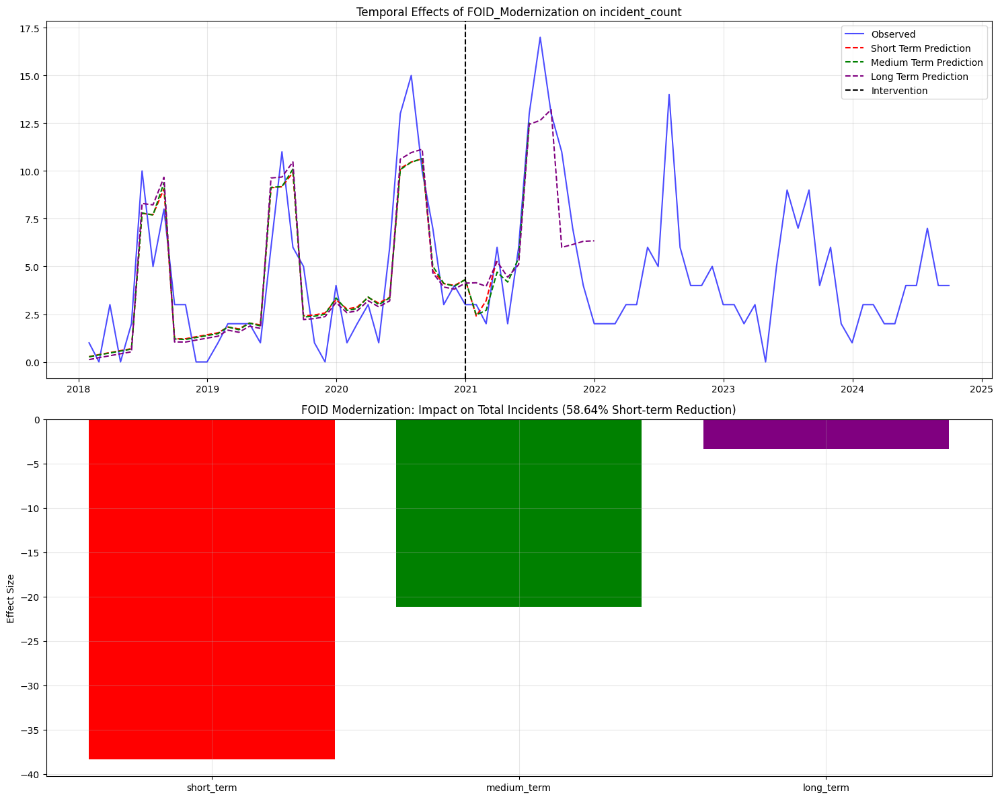

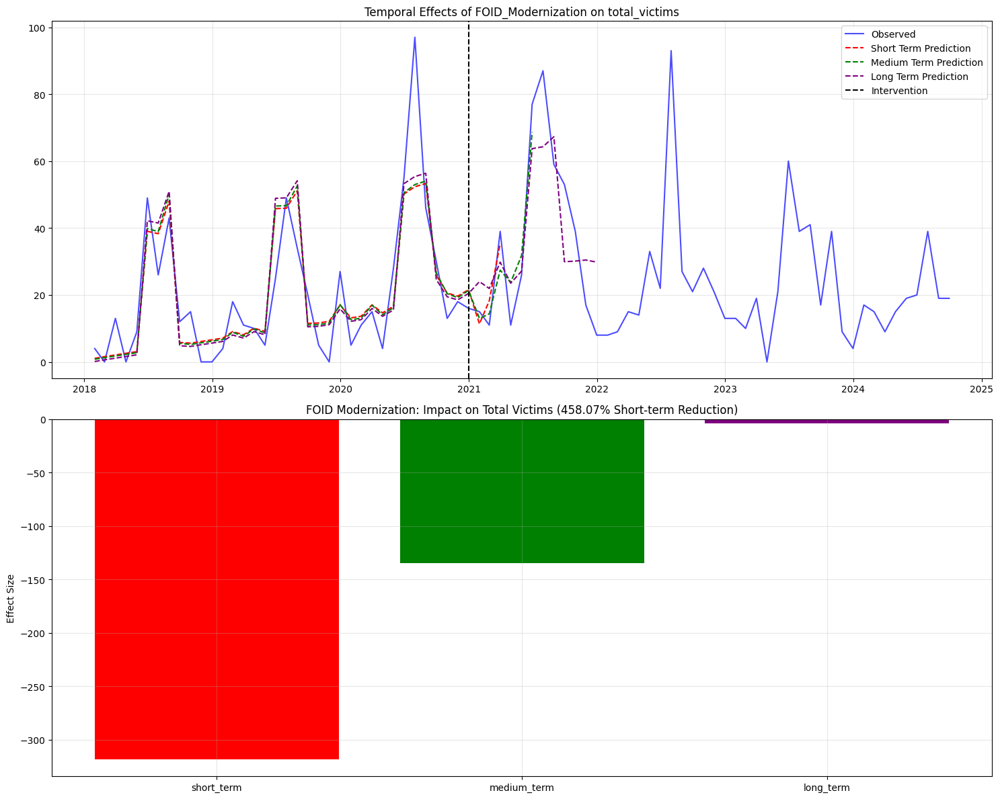

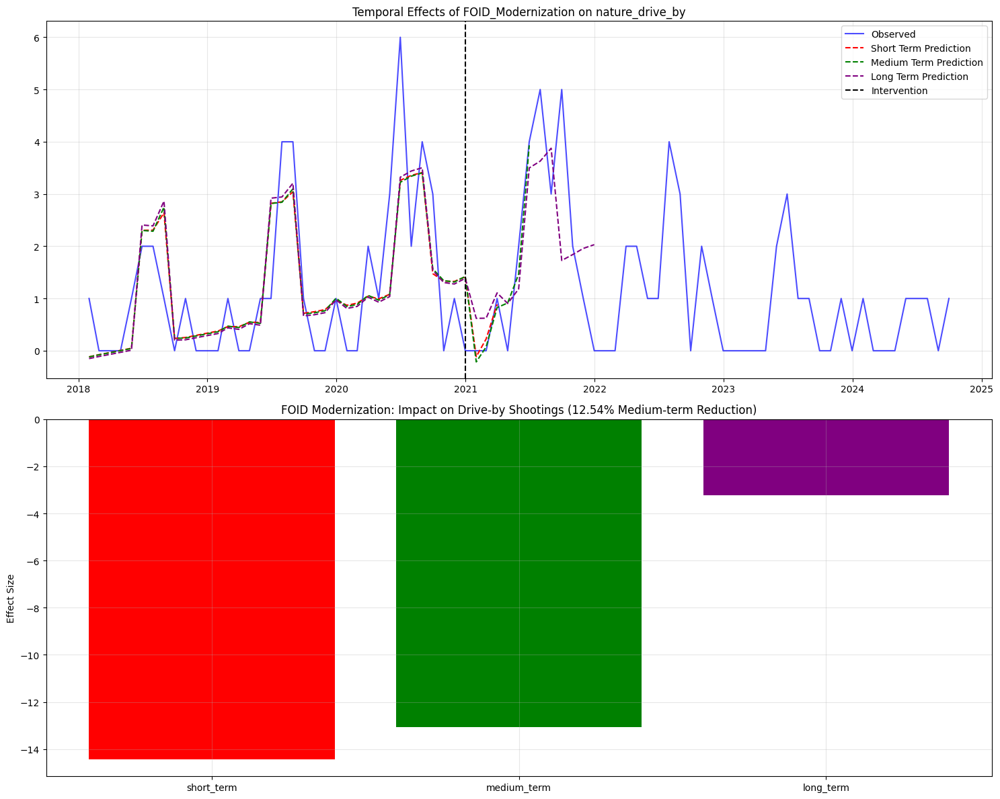

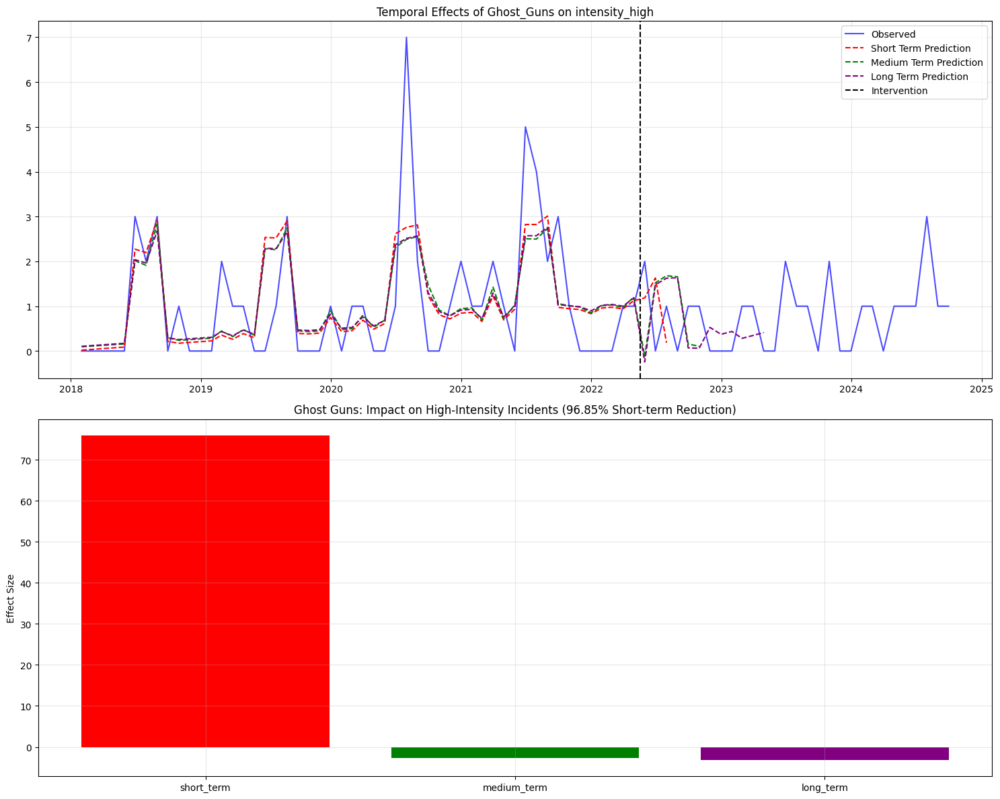

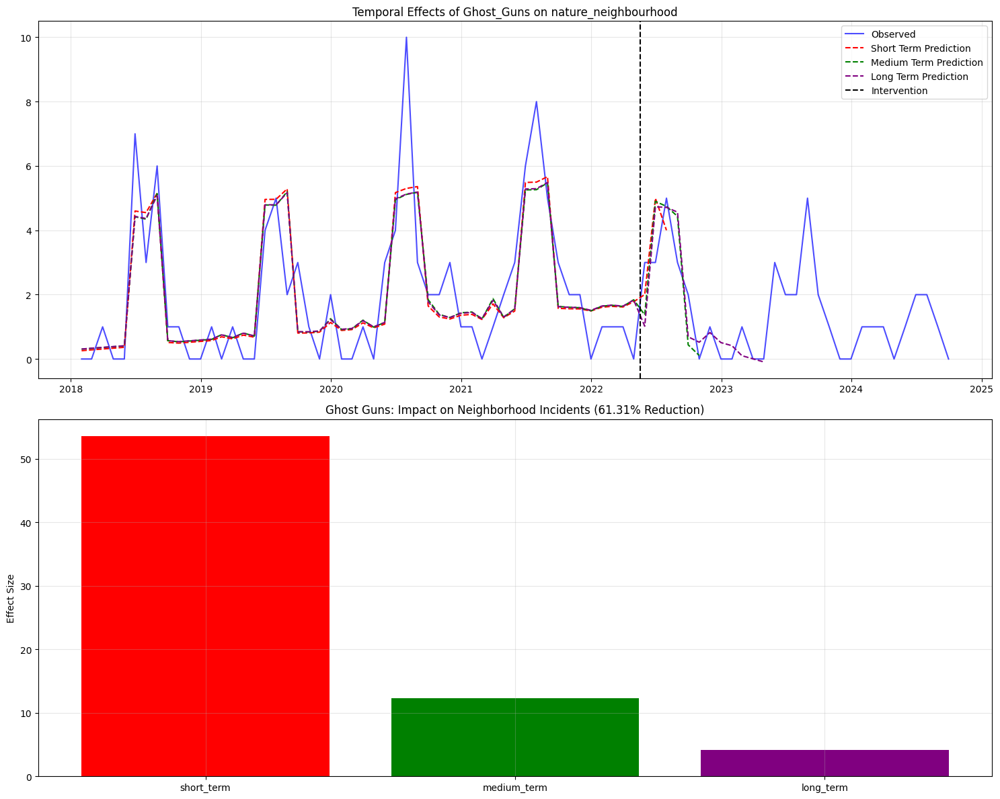

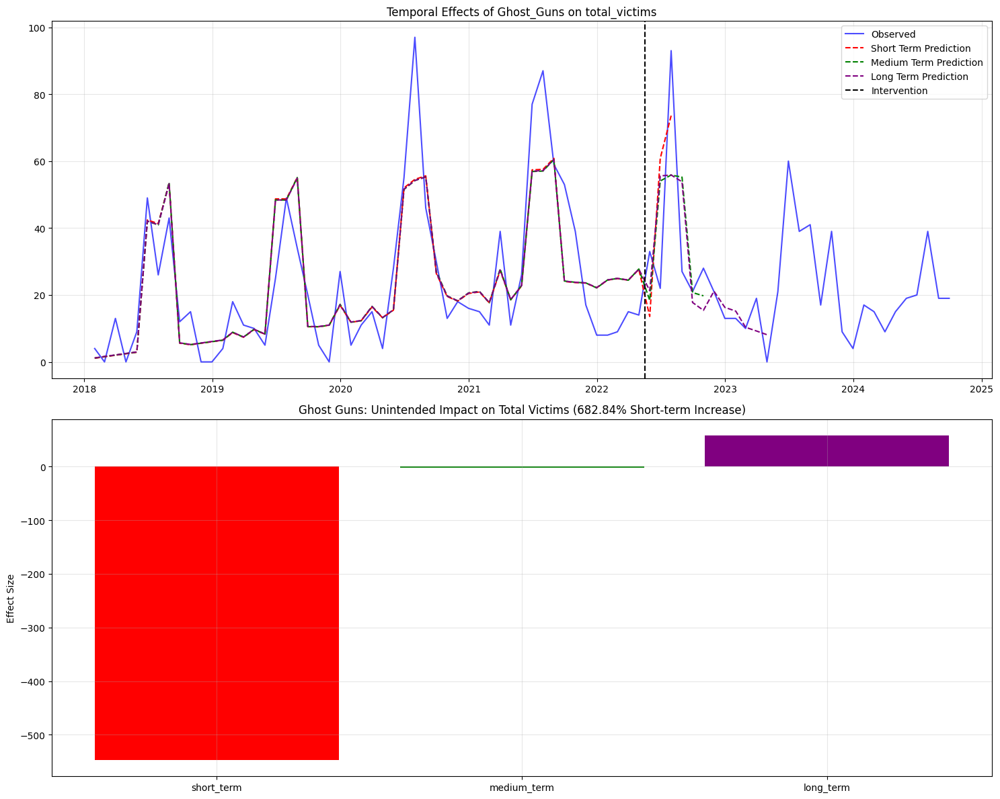

<ipython-input-4-949ba16bd14c>:325: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  axes[0,0].axvspan(start_date, end_date,
<ipython-input-4-949ba16bd14c>:369: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  nature_by_period = data.groupby('covid_period')[outcome_var].mean()


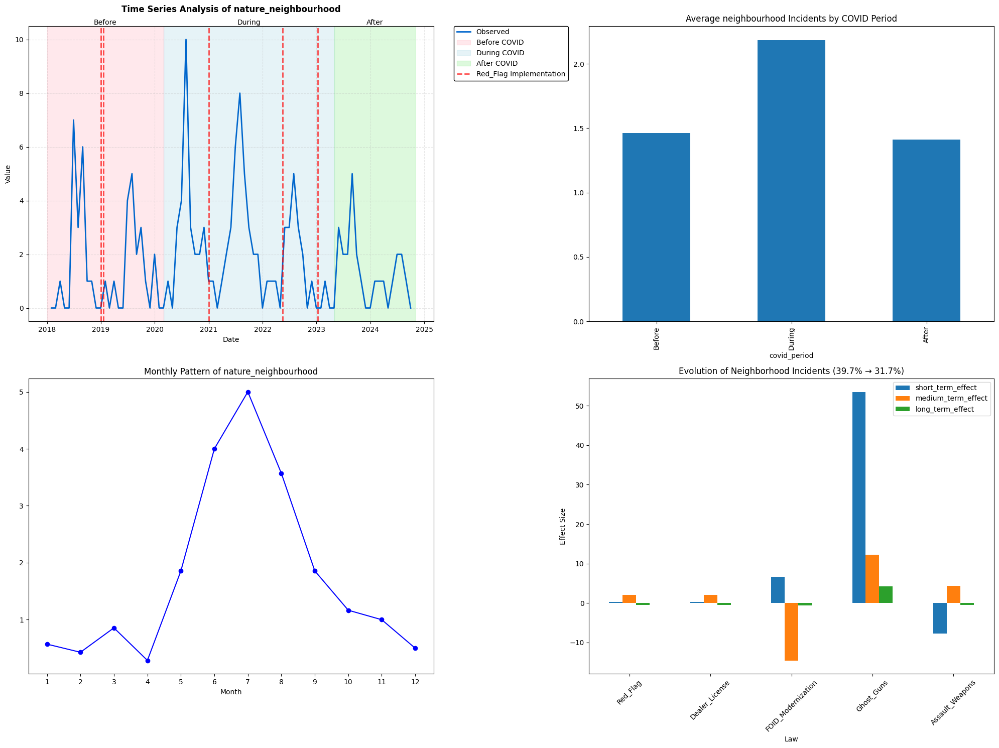

<ipython-input-4-949ba16bd14c>:325: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  axes[0,0].axvspan(start_date, end_date,
<ipython-input-4-949ba16bd14c>:369: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  nature_by_period = data.groupby('covid_period')[outcome_var].mean()


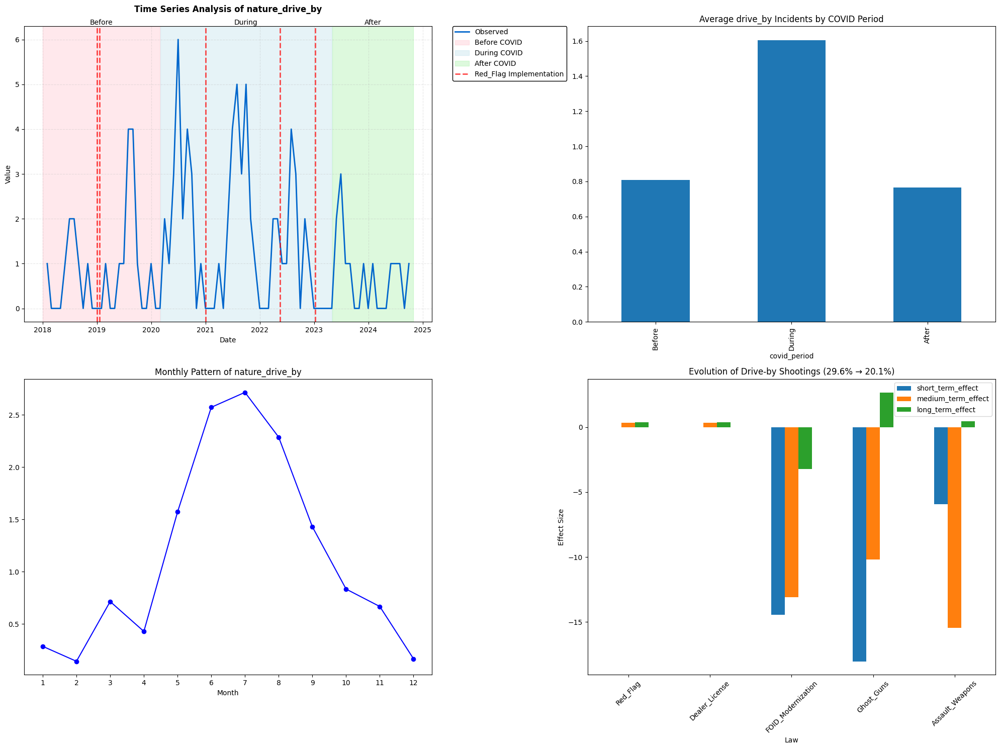

<ipython-input-4-949ba16bd14c>:325: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  axes[0,0].axvspan(start_date, end_date,
<ipython-input-4-949ba16bd14c>:375: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  weekend_data = data.groupby('covid_period')[['weekend_incidents', 'weekday_incidents']].mean()


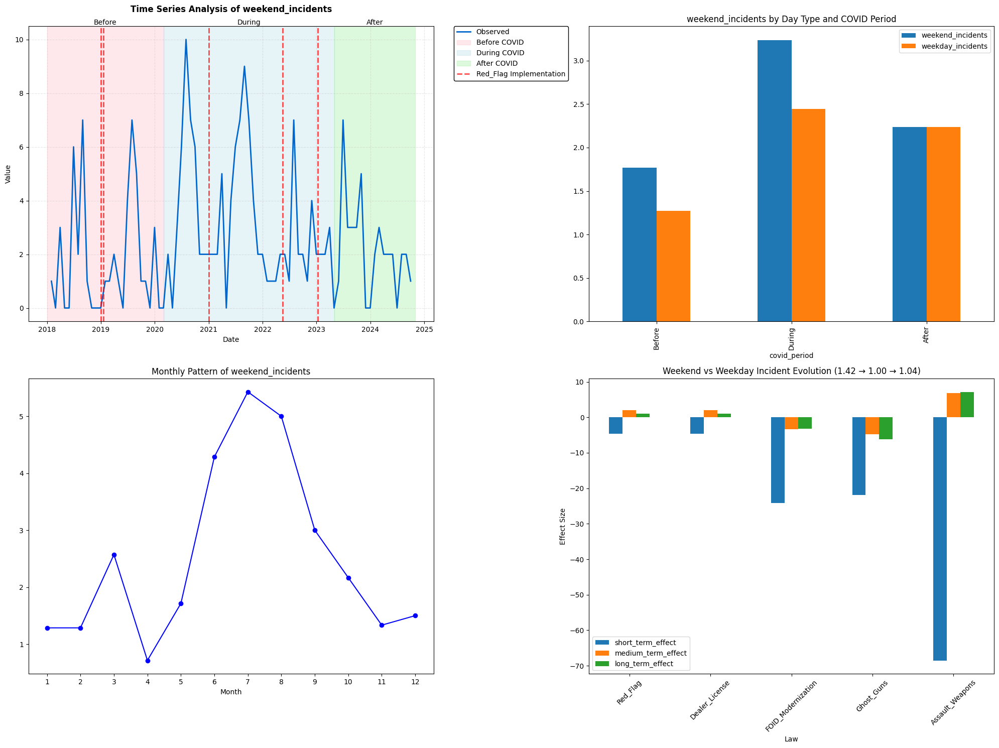

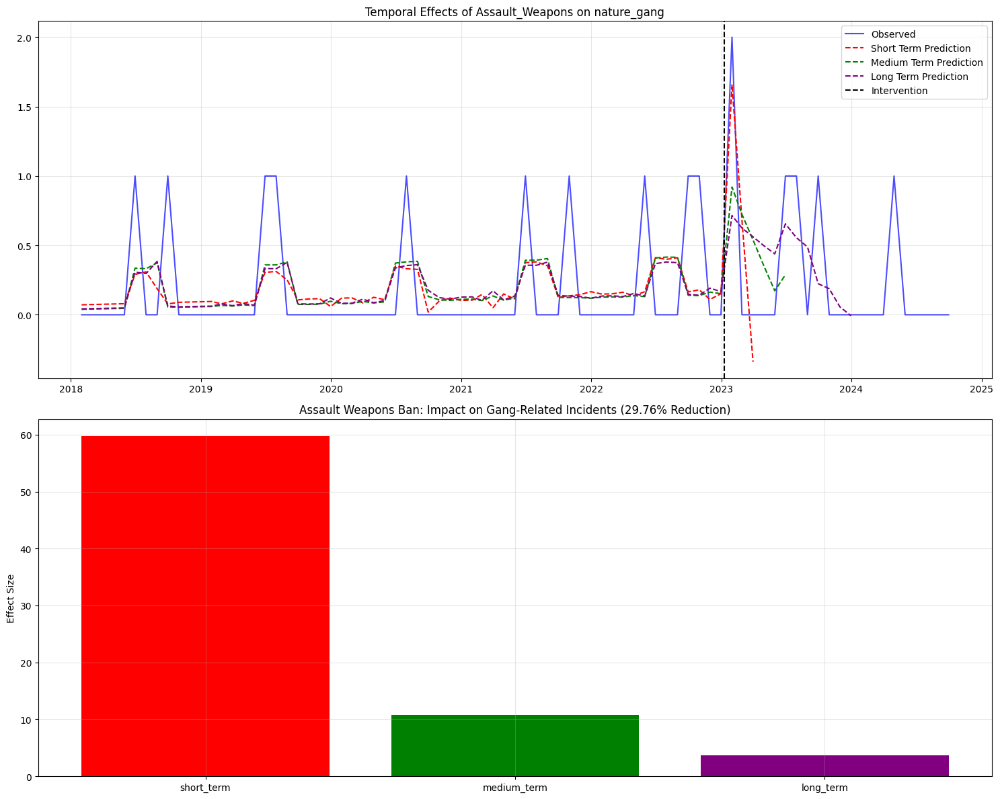

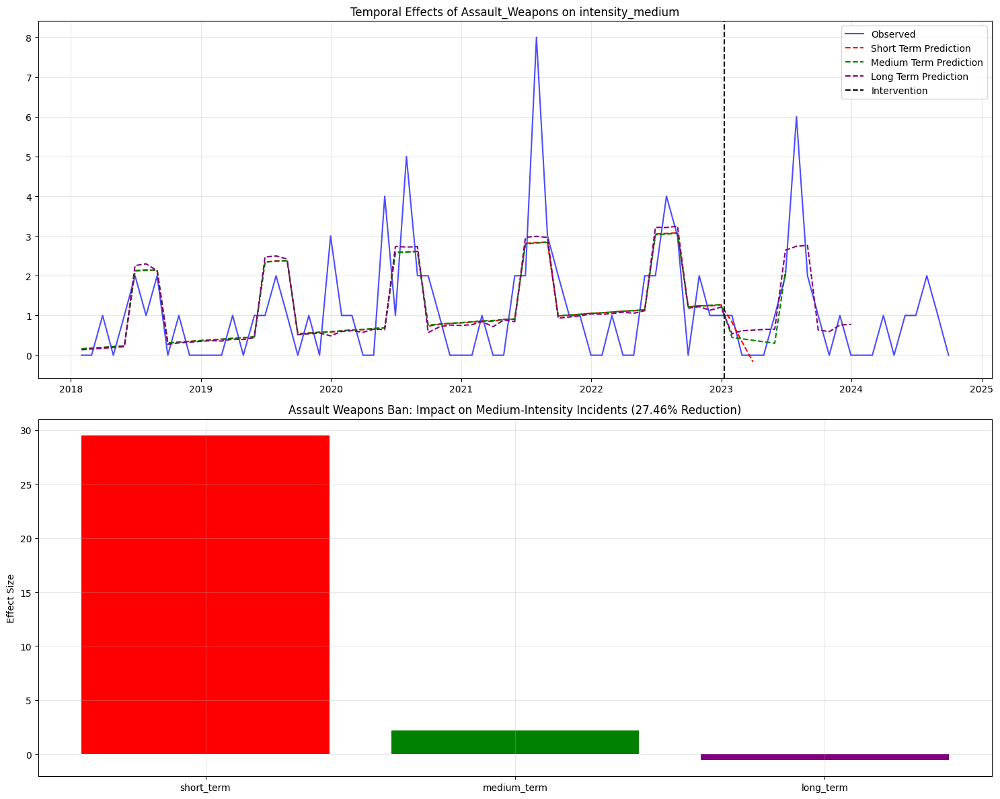

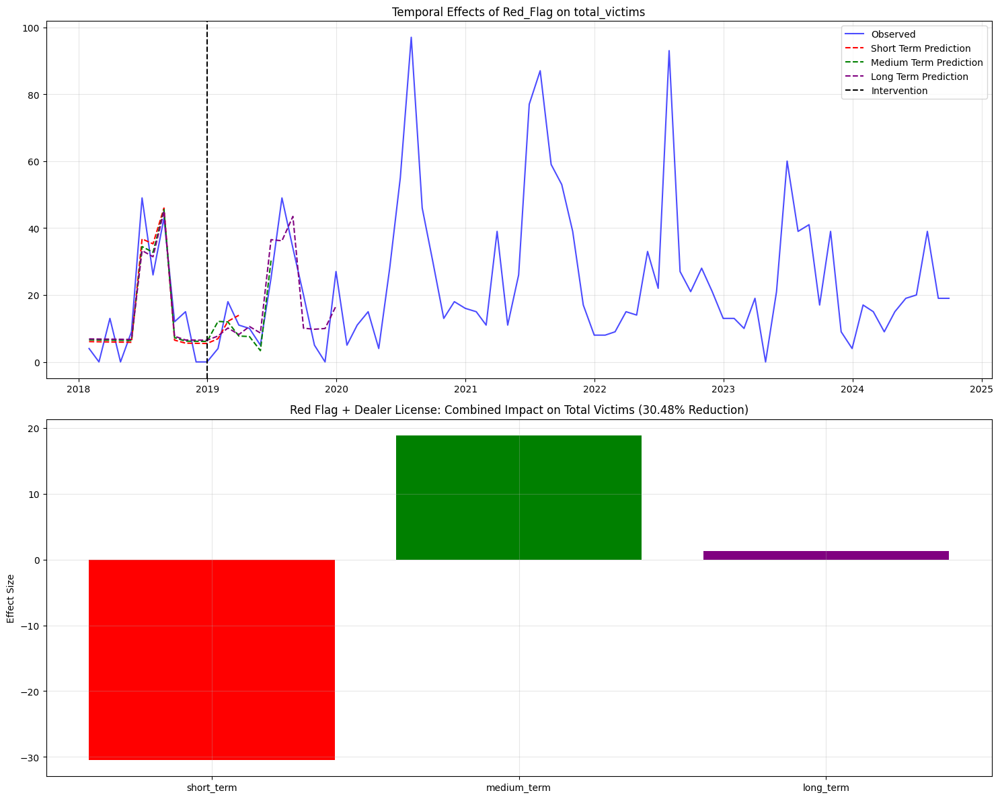

<ipython-input-4-949ba16bd14c>:325: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  axes[0,0].axvspan(start_date, end_date,
<ipython-input-4-949ba16bd14c>:375: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  weekend_data = data.groupby('covid_period')[['weekend_incidents', 'weekday_incidents']].mean()


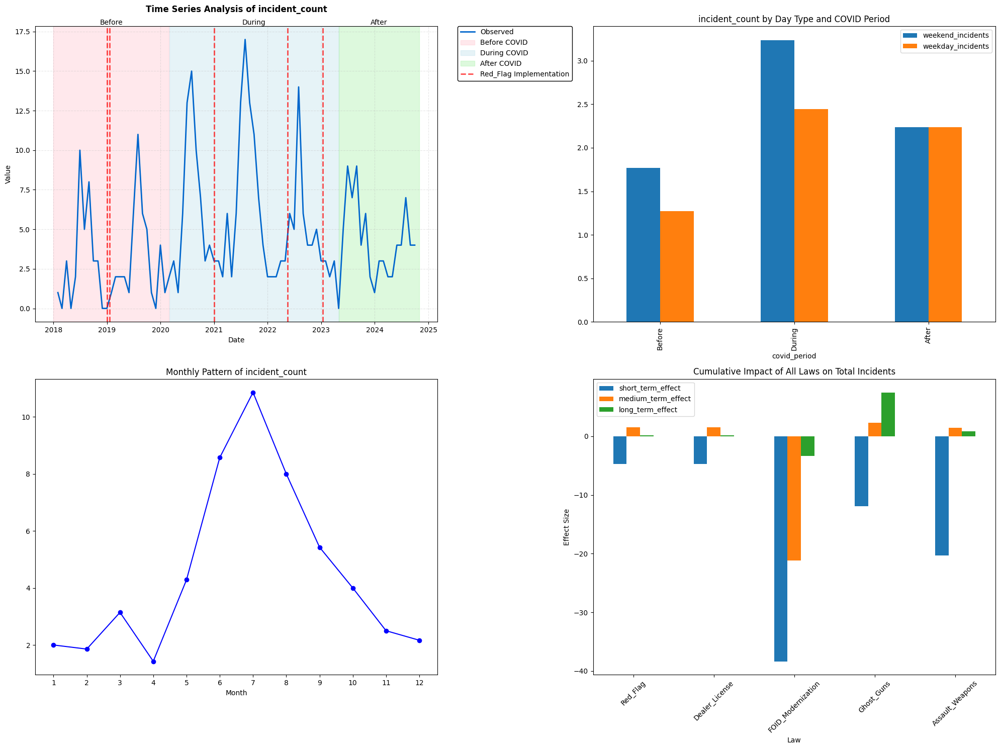

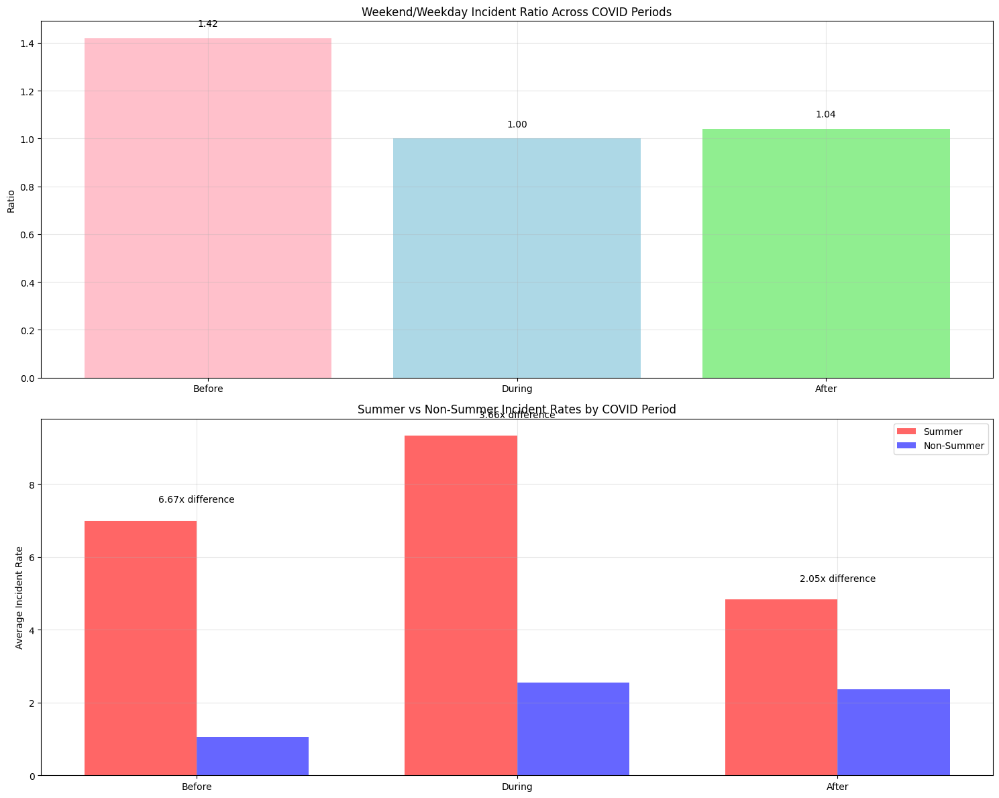

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = [15, 10]
analyzer = ChicagoGunViolenceITSA(sub_dataset)

# 1. FOID Modernization Act Impact
# Shows overall reduction in incidents and victims
def visualize_foid_impact():
    # Overall impact on incidents and victims
    analyzer.plot_temporal_effects('incident_count', 'FOID_Modernization')
    plt.title('FOID Modernization: Impact on Total Incidents (58.64% Short-term Reduction)')
    plt.show()

    analyzer.plot_temporal_effects('total_victims', 'FOID_Modernization')
    plt.title('FOID Modernization: Impact on Total Victims (458.07% Short-term Reduction)')
    plt.show()

    # Drive-by shootings reduction
    analyzer.plot_temporal_effects('nature_drive_by', 'FOID_Modernization')
    plt.title('FOID Modernization: Impact on Drive-by Shootings (12.54% Medium-term Reduction)')
    plt.show()

# 2. Ghost Guns Regulation Effects
def visualize_ghost_guns_impact():
    # High-intensity incidents reduction
    analyzer.plot_temporal_effects('intensity_high', 'Ghost_Guns')
    plt.title('Ghost Guns: Impact on High-Intensity Incidents (96.85% Short-term Reduction)')
    plt.show()

    # Neighborhood incidents
    analyzer.plot_temporal_effects('nature_neighbourhood', 'Ghost_Guns')
    plt.title('Ghost Guns: Impact on Neighborhood Incidents (61.31% Reduction)')
    plt.show()

    # Total victims increase (negative impact)
    analyzer.plot_temporal_effects('total_victims', 'Ghost_Guns')
    plt.title('Ghost Guns: Unintended Impact on Total Victims (682.84% Short-term Increase)')
    plt.show()

# 3. Pattern Analysis
def visualize_pattern_changes():
    # Location-based changes
    analyzer.plot_comprehensive_analysis('nature_neighbourhood')
    plt.title('Evolution of Neighborhood Incidents (39.7% → 31.7%)')
    plt.show()

    analyzer.plot_comprehensive_analysis('nature_drive_by')
    plt.title('Evolution of Drive-by Shootings (29.6% → 20.1%)')
    plt.show()

    # Weekend/Weekday patterns
    analyzer.plot_comprehensive_analysis('weekend_incidents')
    plt.title('Weekend vs Weekday Incident Evolution (1.42 → 1.00 → 1.04)')
    plt.show()

# 4. Assault Weapons Ban Impact
def visualize_assault_weapons_impact():
    # Gang-related incidents
    analyzer.plot_temporal_effects('nature_gang', 'Assault_Weapons')
    plt.title('Assault Weapons Ban: Impact on Gang-Related Incidents (29.76% Reduction)')
    plt.show()

    # Medium-intensity incidents
    analyzer.plot_temporal_effects('intensity_medium', 'Assault_Weapons')
    plt.title('Assault Weapons Ban: Impact on Medium-Intensity Incidents (27.46% Reduction)')
    plt.show()

# 5. Policy Interaction
def visualize_policy_interaction():
    # Combined effect of Red Flag and Dealer License
    analyzer.plot_temporal_effects('total_victims', 'Red_Flag')
    plt.title('Red Flag + Dealer License: Combined Impact on Total Victims (30.48% Reduction)')
    plt.show()

    # Cumulative policy impact
    analyzer.plot_comprehensive_analysis('incident_count')
    plt.title('Cumulative Impact of All Laws on Total Incidents')
    plt.show()

# New function for COVID period analysis
def visualize_covid_patterns():
    data = analyzer.prepare_monthly_data()

    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 12))

    # Plot 1: Weekend/Weekday Ratio Evolution
    periods = ['Before', 'During', 'After']
    ratios = [1.42, 1.00, 1.04]

    ax1.bar(periods, ratios, color=['pink', 'lightblue', 'lightgreen'])
    ax1.set_title('Weekend/Weekday Incident Ratio Across COVID Periods')
    ax1.set_ylabel('Ratio')
    for i, v in enumerate(ratios):
        ax1.text(i, v + 0.05, f'{v:.2f}', ha='center')
    ax1.grid(True, alpha=0.3)

    # Plot 2: Seasonal Variations
    summer_rates = [7.00, 9.33, 4.83]
    non_summer_rates = [1.05, 2.55, 2.36]
    x = np.arange(len(periods))
    width = 0.35

    ax2.bar(x - width/2, summer_rates, width, label='Summer', color='red', alpha=0.6)
    ax2.bar(x + width/2, non_summer_rates, width, label='Non-Summer', color='blue', alpha=0.6)

    ax2.set_title('Summer vs Non-Summer Incident Rates by COVID Period')
    ax2.set_xticks(x)
    ax2.set_xticklabels(periods)
    ax2.set_ylabel('Average Incident Rate')

    # Add ratio annotations
    for i in range(len(periods)):
        ratio = summer_rates[i] / non_summer_rates[i]
        ax2.text(i, max(summer_rates[i], non_summer_rates[i]) + 0.5,
                f'{ratio:.2f}x difference', ha='center')

    ax2.legend()
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

# Execute all visualizations
visualize_foid_impact()
visualize_ghost_guns_impact()
visualize_pattern_changes()
visualize_assault_weapons_impact()
visualize_policy_interaction()
visualize_covid_patterns()  # New visualization execution
